In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasetcanet/new_data/real_size.csv
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R14-0324a ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R16-0398A ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_1202184 D5 ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R13-0019 ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R12-0315 ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R13-0494a ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R14-0118 ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R16-0330A ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R13-0163 ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R14-0323 ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid/GT_ICM/Blast_PCRM_R13-0065A ICM_Mask.bmp
/kaggle/input/datasetcanet/new_data/valid

In [2]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K
from glob import glob
import os
from tensorflow.keras.metrics import Recall, Precision, Accuracy, IoU


2025-05-31 14:07:50.833373: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748700471.320598      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748700471.456005      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
" Seeding """
np.random.seed(42)
tf.random.set_seed(42)


In [4]:
SIZE=256
def read_image_tf(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (SIZE, SIZE))
    x = x / 255.0
    return x.astype(np.float32)

def read_mask_tf(path):
    path = path.decode()
    y = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    y = cv2.resize(y, (SIZE, SIZE))
    y[y != 0] = 255
    y = y / 255.0
    y = (y > 0.5).astype(np.float32)
    y = np.expand_dims(y, axis=-1)
    return y

def tf_parse(x_path, y_path):
    def _parse(x_path, y_path):
        x = read_image_tf(x_path)
        y = read_mask_tf(y_path)
        return x, y

    x, y = tf.numpy_function(_parse, [x_path, y_path], [tf.float32, tf.float32])
    x.set_shape([SIZE, SIZE, 3])
    y.set_shape([SIZE, SIZE, 1])
    return x, y

def tf_dataset(x_paths, y_paths, batch_size=16, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((x_paths, y_paths))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.map(tf_parse, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset


In [5]:
def iou(y_true, y_pred):
    y_true = tf.round(y_true)
    y_pred = tf.round(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    iou = (intersection + 1e-15) / (union + 1e-15)
    return iou


smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [6]:
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-7, verbose=1),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=False),
    TensorBoard()

]

In [7]:

import tensorflow as tf
from tensorflow.keras import layers, Model, regularizers
weight_decay=1e-8
def conv_block(x, filters, dropout=False):
    x = layers.Conv2D(filters, (3, 3), padding="same", kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Conv2D(filters, (3, 3), padding="same", kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    if dropout:
        x = layers.Dropout(0.5)(x)

    return x


def encoder_block(x, filters):
    c = conv_block(x, filters)
    p = layers.MaxPooling2D((2, 2))(c)
    return c, p

def decoder_block(x, skip, filters):
    x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_unet(input_shape):
    inputs = tf.keras.Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    # Apply dropout in encoder 4
    s4 = conv_block(p3, 512, dropout=True)
    p4 = layers.MaxPooling2D((2, 2))(s4)

    # Apply dropout in bottleneck
    b1 = conv_block(p4, 1024, dropout=True)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    return Model(inputs, outputs)

In [9]:
train_y = '/kaggle/input/datasetcanet/new_data/train/GT_ZP'
train_x = '/kaggle/input/datasetcanet/new_data/train/images'
test_y = '/kaggle/input/datasetcanet/new_data/test/GT_ZP'
test_x = '/kaggle/input/datasetcanet/new_data/test/images'
valid_y = '/kaggle/input/datasetcanet/new_data/valid/GT_ZP'
valid_x = '/kaggle/input/datasetcanet/new_data/valid/images'

train_images = sorted(glob(os.path.join(train_x, "*.bmp")))
train_masks  = sorted(glob(os.path.join(train_y, "*.bmp")))

test_images = sorted(glob(os.path.join(test_x, "*.bmp")))
test_masks  = sorted(glob(os.path.join(test_y, "*.bmp")))

valid_images = sorted(glob(os.path.join(valid_x, "*.bmp")))
valid_masks  = sorted(glob(os.path.join(valid_y, "*.bmp")))

# Create datasets
train_dataset = tf_dataset(train_images, train_masks, batch_size=16)
test_dataset  = tf_dataset(test_images, test_masks, batch_size=16,shuffle=False)
valid_dataset = tf_dataset(valid_images, valid_masks, batch_size=16, shuffle=False)
print("Number of training samples:", len(train_images))
print("Number of validation samples:", len(valid_images))
print("Number of testing samples:", len(test_images))

metrics = [dice_coef, iou, 'accuracy', Recall(), Precision()]

Number of training samples: 995
Number of validation samples: 25
Number of testing samples: 25


In [10]:
def channel_attention(x, ratio=2, name_prefix="attention"):
    channel = x.shape[-1]
    shared_dense_one = layers.Dense(channel // ratio, activation='relu', kernel_initializer='he_normal', name=f"{name_prefix}_dense1")
    shared_dense_two = layers.Dense(channel, kernel_initializer='he_normal', name=f"{name_prefix}_dense2")

    avg_pool = layers.GlobalAveragePooling2D()(x)
    avg_pool = layers.Reshape((1, 1, channel))(avg_pool)
    avg_out = shared_dense_two(shared_dense_one(avg_pool))

    max_pool = layers.GlobalMaxPooling2D()(x)
    max_pool = layers.Reshape((1, 1, channel))(max_pool)
    max_out = shared_dense_two(shared_dense_one(max_pool))

    out = layers.Add(name=f"{name_prefix}_add")([avg_out, max_out])
    attention = layers.Activation('sigmoid', name=f"{name_prefix}_sigmoid")(out)

    scaled = layers.Multiply(name=f"{name_prefix}_multiply")([x, attention])
    out = layers.Add(name=f"{name_prefix}_final_add")([scaled, x])

    return out, attention, scaled


In [11]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf  # Ensure tf is imported

# Get a test sample (image, mask) from the validation dataset
sample = next(iter(valid_dataset))
sample_img = sample[0][0]  # (H, W, C)
sample_mask = sample[1][0]  # (H, W, 1) or (H, W)

# Expand dims for prediction
sample_img_exp = tf.expand_dims(sample_img, axis=0)  # (1, H, W, C)

In [12]:

import tensorflow as tf
from tensorflow.keras import layers

def dual_pathway_spatial_attention(x_l, x_h, out_channels,name_prefix="attention"):
    """
    Dual-pathway AG block: spatial attention for decoder stage s.

    Args:
        x_h: high-level feature map (upsampled from decoder)
        x_l: low-level feature map (from encoder)
        out_channels: number of output channels after ΦC conv (e.g., 64, 32, 16)

    Returns:
        Calibrated feature map after dual-pathway attention.
    """
    def single_path_attention(x_l, x_h):
    # Combine high-level and low-level features
      theta_x_l = layers.Conv2D(out_channels, (1, 1), padding='same')(x_l)
      phi_x_h = layers.Conv2D(out_channels, (1, 1), padding='same')(x_h)
      add = layers.Add()([theta_x_l, phi_x_h])
      act = layers.Activation('relu')(add)

    # Spatial Attention using both average and max pooling
      avg_pool = layers.Lambda(lambda x: tf.reduce_mean(x, axis=-1, keepdims=True))(act)
      max_pool = layers.Lambda(lambda x: tf.reduce_max(x, axis=-1, keepdims=True))(act)
      concat_pool = layers.Concatenate(axis=-1)([avg_pool, max_pool])  # Shape: (H, W, 2)

      attention = layers.Conv2D(1, (7, 7), padding='same', activation='sigmoid')(concat_pool)
      out = layers.Multiply()([x_l, attention])  # x_l · α

      return out


    # First AG pathway
    ag1 = single_path_attention(x_l, x_h)

    # Second AG pathway (can be made slightly different if needed)
    ag2 = single_path_attention(x_l, x_h)

    # Concatenate both pathways (along channel axis)
    concat = layers.Concatenate(axis=-1)([ag1, ag2])

    # Apply ΦC (1x1 conv + BN + ReLU)
    conv = layers.Conv2D(out_channels, (1, 1), padding='same' , use_bias=False)(concat)
    bn = layers.BatchNormalization()(conv)
    out = layers.Activation('relu',name=f"{name_prefix}_outskip")(bn)

    return out


In [13]:
from tensorflow.keras import layers, backend as K
import tensorflow as tf

def SA1_non_local_attention(x, inter_channels=64,name_prefix="attention"):
    input_channels = x.shape[-1]
    H, W = x.shape[1], x.shape[2]  # Capture symbolic H and W

    # Step 1: Reduce channels
    x_0   = layers.Conv2D(inter_channels, (1, 1), padding='same')(x)
    x_00  = layers.Conv2D(inter_channels, (1, 1), padding='same')(x)
    x_000 = layers.Conv2D(inter_channels, (1, 1), padding='same')(x)

    # Step 2: Flatten (B, H, W, C) → (B, H*W, C)
    def reshape_for_attention(y):
        return tf.reshape(y, (tf.shape(y)[0], -1, inter_channels))  # (B, HW, C)

    x_theta = layers.Lambda(reshape_for_attention, output_shape=(None, None, inter_channels))(x_0)
    x_phi   = layers.Lambda(reshape_for_attention, output_shape=(None, None, inter_channels))(x_00)
    x_g     = layers.Lambda(reshape_for_attention, output_shape=(None, None, inter_channels))(x_000)

    # Step 3: Attention weights
    attention_scores = layers.Lambda(
        lambda inputs: tf.matmul(inputs[0], inputs[1], transpose_b=True),
        output_shape=(None, None, None)
    )([x_theta, x_phi])

    attention = layers.Activation('softmax')(attention_scores)

    # Step 4: Apply attention: α · g
    x_att = layers.Lambda(
        lambda inputs: tf.matmul(inputs[0], inputs[1]),
        output_shape=(None, None, inter_channels)
    )([attention, x_g])

    # Step 5: Reshape back to (B, H, W, C)
    def reshape_back(y):
        return tf.reshape(y, (-1, H, W, inter_channels))

    x_att_reshaped = layers.Lambda(reshape_back, output_shape=(H, W, inter_channels))(x_att)

    # Step 6: Project back to input channels
    x_out = layers.Conv2D(input_channels, (1, 1), padding='same', use_bias=False)(x_att_reshaped)
    x_out = layers.BatchNormalization()(x_out)
    final=layers.Add(name=f"{name_prefix}_final_add")([x_out, x])
    return final,x_out


In [14]:
def decoder_blockspc(x,skip, filters,name_prefix="decoder"):
    x = conv_block(x, filters*2)
    x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(x)
    skipatt=dual_pathway_spatial_attention(skip,x,filters,name_prefix=f"{name_prefix}_dualattention")
    x = layers.Concatenate(axis=-1)([x, skipatt])
    x = conv_block(x, filters)
    x,vec,ch=channel_attention(x,name_prefix=f"{name_prefix}_channelattention")
    return x,vec,ch,skipatt


In [15]:
def decoder_blocknlbc(x, skip, filters,name_prefix="decoder"):
    x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(x)
    x = layers.Concatenate()([x, skip])
    x,f = SA1_non_local_attention(x,name_prefix=f"{name_prefix}_nlbattention")
    x = conv_block(x, filters)
    x,vec,ch=channel_attention(x,name_prefix=f"{name_prefix}_channelattention")
    return x,vec,ch,f


In [16]:
def scale_attention_module(features,name_prefix="attention"):
    """
    Paper-faithful Scale Attention Module (CA-Net) with symbolic shape fix.
    Args:
        features: list of decoder feature maps from 4 different scales (d1 to d4)
    Returns:
        Final enhanced feature map (B, H, W, 4)
    """
    H, W = features[3].shape[1], features[3].shape[2]  # symbolic-safe shape

    # 1. Resize all feature maps to same shape
    resized = [layers.Resizing(H, W, interpolation='bilinear')(f) for f in features]

    # 2. Compress to 1 channel per scale
    compressed = [layers.Conv2D(1, (1, 1), padding='same')(f) for f in resized]

    # 3. Concatenate → F̂ (B, H, W, 4)
    F_hat = layers.Concatenate(axis=-1)(compressed)
    shared_dense_one = layers.Dense(4//2 , activation='relu', kernel_initializer='he_normal')
    shared_dense_two = layers.Dense(4, kernel_initializer='he_normal')
    # 4. Scale-wise attention γ
    gap = layers.GlobalAveragePooling2D()(F_hat)
    gmp = layers.GlobalMaxPooling2D()(F_hat)
    gap = layers.Reshape((1, 1, 4))(gap)
    gmp = layers.Reshape((1, 1, 4))(gmp)
    gap = shared_dense_two(shared_dense_one(gap))
    gmp = shared_dense_two(shared_dense_one(gmp))
    gamma = layers.Add()([gap, gmp])
    gamma = layers.Activation('sigmoid')(gamma)  # (B, 1, 1, 4)

    F_gamma = layers.Multiply()([F_hat, gamma])  # (B, H, W, 4)

    # 5. Pixel-wise scale attention γ*
    x = layers.Conv2D(4, (3, 3), padding='same', activation='relu')(F_gamma)
    gamma_star = layers.Conv2D(4, (1, 1), padding='same', activation='sigmoid')(x)


    # 6. Final residual + fused output
    out = layers.Add()([
        layers.Multiply()([F_gamma, gamma_star]),
        layers.Multiply()([F_hat, gamma]),
        F_hat
    ])
    x = layers.Activation("relu")(out)
    x = layers.Conv2D(4, (3, 3), padding="same", kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu",name=f"{name_prefix}_final")(x)

    return x


In [17]:
def build_unettotale(input_shape):
    inputs = tf.keras.Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4 = conv_block(p3, 512, dropout=True)
    p4 = layers.MaxPooling2D((2, 2))(s4)

    # Apply dropout in bottleneck
    b1 = conv_block(p4, 1024, dropout=True)
    d1,vec,ch1,SA1 = decoder_blocknlbc(b1, s4, 512,name_prefix="decoder1")
    d2,vec,ch2,SA2 = decoder_blockspc(d1, s3, 256,name_prefix="decoder2")
    d3,vec,ch3,SA3 = decoder_blockspc(d2, s2, 128,name_prefix="decoder3")
    d4,vec,ch4,SA4 = decoder_blockspc(d3, s1, 64,name_prefix="decoder4")
    la_output = scale_attention_module([d1, d2, d3, d4],name_prefix="scaler")  # returns enhanced feature map

    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid",name="segmentation_output")(la_output)

    return Model(inputs=inputs, outputs=outputs)

In [18]:
# Now build and compile model like you did
input_shape = ((SIZE, SIZE, 3))
modelzp_totale = build_unettotale(input_shape)
modelzp_totale.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4, weight_decay=1e-8),
    loss=dice_loss,
    metrics=metrics
)

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

class FinalFeatureMapCallback(tf.keras.callbacks.Callback):
    def __init__(self, feature_extractor, val_data):
        super(FinalFeatureMapCallback, self).__init__()
        self.feature_extractor = feature_extractor
        self.val_data = val_data

    def on_train_end(self, logs=None):
        # Get the last image from the last batch of val_data
        last_image = None
        for batch in self.val_data:
            last_image = batch[0]  # (inputs, labels)

        if last_image is None:
            print("Validation data is empty.")
            return

        image = last_image[-1:]  # shape (1, H, W, C)

        # Get feature maps
        feature_maps = self.feature_extractor.predict(image)

        # Plot the first channel of each decoder output
        fig, axes = plt.subplots(1, len(feature_maps), figsize=(20, 5))
        for i, fmap in enumerate(feature_maps):
            fmap = np.squeeze(fmap)  # (H, W, C)
            axes[i].imshow(fmap[:, :, 0], cmap='jet')  # first channel
            axes[i].set_title(f'Decoder {i + 1}')
            axes[i].axis('off')

        plt.suptitle('Final Feature Maps (last val image, last epoch)')
        plt.show()


In [20]:
layer_names = [
    "decoder1_nlbattention_final_add",
    "decoder1_channelattention_final_add",
    "decoder2_dualattention_outskip",
    "decoder2_channelattention_final_add",
    "decoder3_dualattention_outskip",
    "decoder3_channelattention_final_add",
    "decoder4_dualattention_outskip",
    "decoder4_channelattention_final_add",
    "scaler_final"
]
# Create a new model that outputs the attention layers
feature_extractor = tf.keras.Model(inputs=modelzp_totale.input,
                                   outputs=[modelzp_totale.get_layer(name).output for name in layer_names])



In [21]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

class FinalFeatureMapCallback(tf.keras.callbacks.Callback):
    def __init__(self, feature_extractor, val_data, freq=5):
        super(FinalFeatureMapCallback, self).__init__()
        self.feature_extractor = feature_extractor
        self.val_data = val_data
        self.freq = freq

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.freq != 0:
            return  # Skip this epoch

        # Get the last image from the last batch of val_data
        last_image = None
        for batch in self.val_data:
            last_image = batch[0]  # (inputs, labels)

        if last_image is None:
            print("Validation data is empty.")
            return

        image = last_image[-1:]  # shape (1, H, W, C)

        # Get feature maps
        feature_maps = self.feature_extractor.predict(image)

        # Plot the first channel of each decoder output
        fig, axes = plt.subplots(1, len(feature_maps), figsize=(20, 5))
        for i, fmap in enumerate(feature_maps):
            fmap = np.squeeze(fmap)  # (H, W, C)
            axes[i].imshow(fmap[:, :, 0], cmap='jet')  # first channel
            axes[i].set_title(f'Decoder {i + 1}')
            axes[i].axis('off')

        plt.suptitle(f'Feature Maps - Epoch {epoch + 1}')
        plt.tight_layout()
        plt.show()


In [23]:
feature_map_callback = FinalFeatureMapCallback(feature_extractor, val_data=valid_dataset,freq=5)


Epoch 1/300


I0000 00:00:1748700774.464591     100 service.cc:148] XLA service 0x7d5198015760 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748700774.466532     100 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1748700774.466550     100 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1748700778.946690     100 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-05-31 14:13:06.829844: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng12{k11=0} for conv (f32[16,128,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,128,128,128]{3,2,1,0}, f32[128,128,3,3]{3,2,1,0}, f32[128]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest

62/63 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.6823 - dice_coef: 0.3485 - iou: 0.3000 - loss: 0.6515 - precision_1: 0.3105 - recall_1: 0.8171

E0000 00:00:1748701027.695013     100 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748701027.913694     100 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748701033.986671     100 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748701034.288940     100 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748701039.904671     100 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6834 - dice_coef: 0.3492 - iou: 0.3013 - loss: 0.6508 - precision_1: 0.3116 - recall_1: 0.8184

E0000 00:00:1748701093.408831     100 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748701093.637557     100 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


63/63 ━━━━━━━━━━━━━━━━━━━━ 371s 4s/step - accuracy: 0.6845 - dice_coef: 0.3498 - iou: 0.3025 - loss: 0.6501 - precision_1: 0.3127 - recall_1: 0.8197 - val_accuracy: 0.8282 - val_dice_coef: 0.2317 - val_iou: 0.0600 - val_loss: 0.7640 - val_precision_1: 0.3869 - val_recall_1: 0.0767 - learning_rate: 1.0000e-04
Epoch 2/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.8641 - dice_coef: 0.4412 - iou: 0.5298 - loss: 0.5588 - precision_1: 0.5432 - recall_1: 0.9528 - val_accuracy: 0.8137 - val_dice_coef: 0.2305 - val_iou: 0.0588 - val_loss: 0.7644 - val_precision_1: 0.2789 - val_recall_1: 0.0840 - learning_rate: 1.0000e-04
Epoch 3/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.8990 - dice_coef: 0.4559 - iou: 0.5983 - loss: 0.5441 - precision_1: 0.6152 - recall_1: 0.9561 - val_accuracy: 0.8415 - val_dice_coef: 0.3642 - val_iou: 0.3890 - val_loss: 0.6302 - val_precision_1: 0.5147 - val_recall_1: 0.6310 - learning_rate: 1.0000e-04
Epoch 4/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s

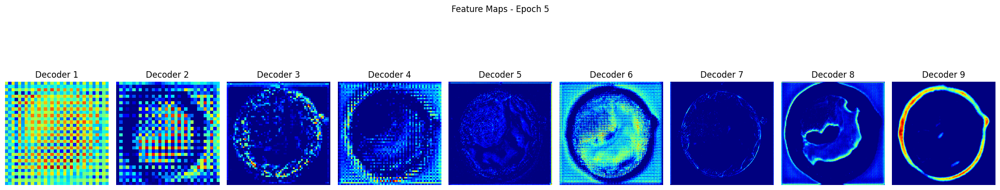

63/63 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.9244 - dice_coef: 0.4713 - iou: 0.6641 - loss: 0.5287 - precision_1: 0.6813 - recall_1: 0.9636 - val_accuracy: 0.9270 - val_dice_coef: 0.4401 - val_iou: 0.6693 - val_loss: 0.5537 - val_precision_1: 0.7156 - val_recall_1: 0.9232 - learning_rate: 1.0000e-04
Epoch 6/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9275 - dice_coef: 0.4810 - iou: 0.6772 - loss: 0.5189 - precision_1: 0.6954 - recall_1: 0.9642 - val_accuracy: 0.8924 - val_dice_coef: 0.3650 - val_iou: 0.4535 - val_loss: 0.6343 - val_precision_1: 0.7456 - val_recall_1: 0.5249 - learning_rate: 1.0000e-04
Epoch 7/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9363 - dice_coef: 0.4920 - iou: 0.7082 - loss: 0.5080 - precision_1: 0.7244 - recall_1: 0.9705 - val_accuracy: 0.9180 - val_dice_coef: 0.4455 - val_iou: 0.6337 - val_loss: 0.5497 - val_precision_1: 0.7018 - val_recall_1: 0.8715 - learning_rate: 1.0000e-04
Epoch 8/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s

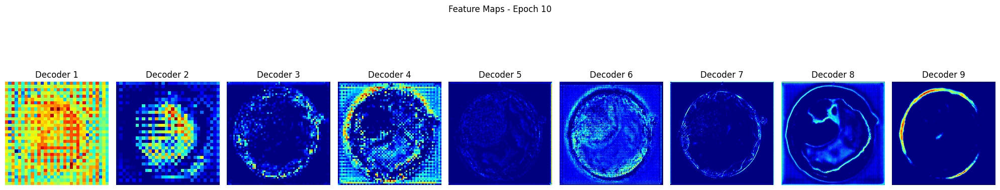

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9410 - dice_coef: 0.4999 - iou: 0.7207 - loss: 0.5001 - precision_1: 0.7372 - recall_1: 0.9719 - val_accuracy: 0.9362 - val_dice_coef: 0.4571 - val_iou: 0.7045 - val_loss: 0.5404 - val_precision_1: 0.7742 - val_recall_1: 0.8639 - learning_rate: 1.0000e-04
Epoch 11/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9479 - dice_coef: 0.5064 - iou: 0.7449 - loss: 0.4937 - precision_1: 0.7608 - recall_1: 0.9742 - val_accuracy: 0.9379 - val_dice_coef: 0.4615 - val_iou: 0.6970 - val_loss: 0.5346 - val_precision_1: 0.7969 - val_recall_1: 0.8351 - learning_rate: 1.0000e-04
Epoch 12/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9494 - dice_coef: 0.5123 - iou: 0.7518 - loss: 0.4877 - precision_1: 0.7699 - recall_1: 0.9719 - val_accuracy: 0.9004 - val_dice_coef: 0.4735 - val_iou: 0.6096 - val_loss: 0.5233 - val_precision_1: 0.6350 - val_recall_1: 0.9270 - learning_rate: 1.0000e-04
Epoch 13/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s

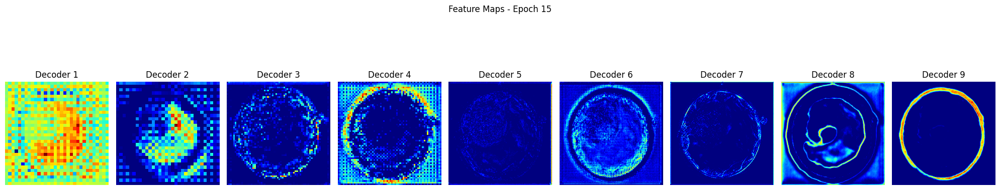

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9544 - dice_coef: 0.5160 - iou: 0.7648 - loss: 0.4839 - precision_1: 0.7829 - recall_1: 0.9731 - val_accuracy: 0.9425 - val_dice_coef: 0.5066 - val_iou: 0.7355 - val_loss: 0.4909 - val_precision_1: 0.7736 - val_recall_1: 0.9192 - learning_rate: 1.0000e-04
Epoch 16/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9571 - dice_coef: 0.5317 - iou: 0.7823 - loss: 0.4683 - precision_1: 0.7978 - recall_1: 0.9782 - val_accuracy: 0.9549 - val_dice_coef: 0.4913 - val_iou: 0.7752 - val_loss: 0.5065 - val_precision_1: 0.8326 - val_recall_1: 0.9083 - learning_rate: 1.0000e-04
Epoch 17/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9588 - dice_coef: 0.5324 - iou: 0.7872 - loss: 0.4675 - precision_1: 0.8030 - recall_1: 0.9776 - val_accuracy: 0.9309 - val_dice_coef: 0.5167 - val_iou: 0.6911 - val_loss: 0.4770 - val_precision_1: 0.7126 - val_recall_1: 0.9717 - learning_rate: 1.0000e-04
Epoch 18/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

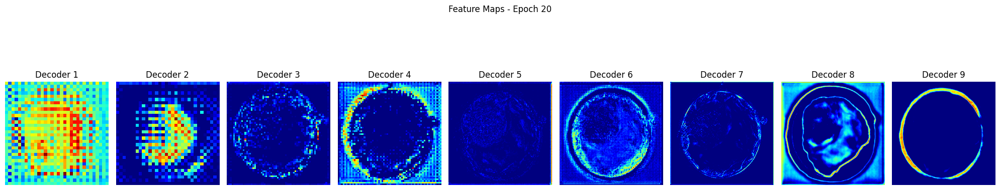

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9630 - dice_coef: 0.5499 - iou: 0.8074 - loss: 0.4501 - precision_1: 0.8243 - recall_1: 0.9764 - val_accuracy: 0.9555 - val_dice_coef: 0.5217 - val_iou: 0.7768 - val_loss: 0.4752 - val_precision_1: 0.8580 - val_recall_1: 0.8740 - learning_rate: 1.0000e-04
Epoch 21/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9625 - dice_coef: 0.5505 - iou: 0.8043 - loss: 0.4495 - precision_1: 0.8211 - recall_1: 0.9760 - val_accuracy: 0.9511 - val_dice_coef: 0.5282 - val_iou: 0.7686 - val_loss: 0.4685 - val_precision_1: 0.7848 - val_recall_1: 0.9676 - learning_rate: 1.0000e-04
Epoch 22/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9638 - dice_coef: 0.5571 - iou: 0.8104 - loss: 0.4430 - precision_1: 0.8249 - recall_1: 0.9806 - val_accuracy: 0.9487 - val_dice_coef: 0.5261 - val_iou: 0.7564 - val_loss: 0.4730 - val_precision_1: 0.8168 - val_recall_1: 0.8865 - learning_rate: 1.0000e-04
Epoch 23/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s

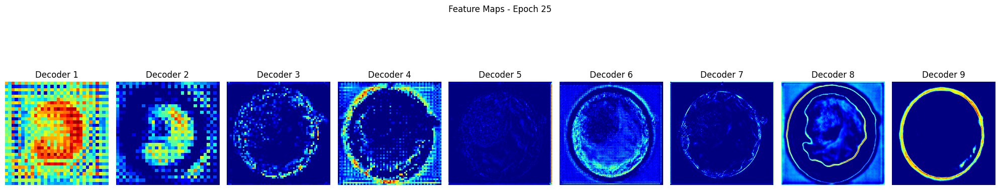

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9648 - dice_coef: 0.5664 - iou: 0.8126 - loss: 0.4336 - precision_1: 0.8290 - recall_1: 0.9793 - val_accuracy: 0.9211 - val_dice_coef: 0.5346 - val_iou: 0.6751 - val_loss: 0.4634 - val_precision_1: 0.6909 - val_recall_1: 0.9411 - learning_rate: 1.0000e-04
Epoch 26/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9596 - dice_coef: 0.5661 - iou: 0.7919 - loss: 0.4339 - precision_1: 0.8080 - recall_1: 0.9758 - val_accuracy: 0.9492 - val_dice_coef: 0.5566 - val_iou: 0.7560 - val_loss: 0.4386 - val_precision_1: 0.7849 - val_recall_1: 0.9518 - learning_rate: 1.0000e-04
Epoch 27/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9677 - dice_coef: 0.5763 - iou: 0.8265 - loss: 0.4236 - precision_1: 0.8413 - recall_1: 0.9810 - val_accuracy: 0.9337 - val_dice_coef: 0.5360 - val_iou: 0.7012 - val_loss: 0.4602 - val_precision_1: 0.7358 - val_recall_1: 0.9315 - learning_rate: 1.0000e-04
Epoch 28/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

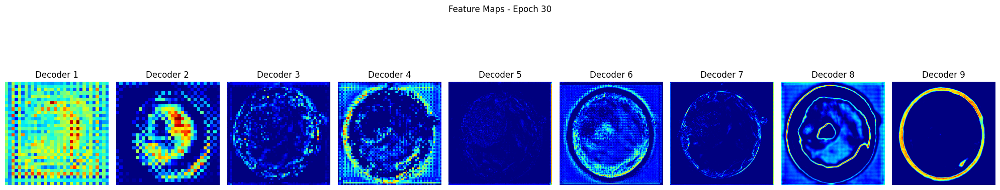

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9693 - dice_coef: 0.5922 - iou: 0.8357 - loss: 0.4078 - precision_1: 0.8494 - recall_1: 0.9820 - val_accuracy: 0.9535 - val_dice_coef: 0.5664 - val_iou: 0.7688 - val_loss: 0.4281 - val_precision_1: 0.8072 - val_recall_1: 0.9426 - learning_rate: 1.0000e-04
Epoch 31/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9701 - dice_coef: 0.5958 - iou: 0.8387 - loss: 0.4042 - precision_1: 0.8533 - recall_1: 0.9812 - val_accuracy: 0.9426 - val_dice_coef: 0.5469 - val_iou: 0.7279 - val_loss: 0.4507 - val_precision_1: 0.7854 - val_recall_1: 0.8954 - learning_rate: 1.0000e-04
Epoch 32/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9711 - dice_coef: 0.5991 - iou: 0.8425 - loss: 0.4009 - precision_1: 0.8576 - recall_1: 0.9811 - val_accuracy: 0.9615 - val_dice_coef: 0.5769 - val_iou: 0.8042 - val_loss: 0.4181 - val_precision_1: 0.8384 - val_recall_1: 0.9485 - learning_rate: 1.0000e-04
Epoch 33/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

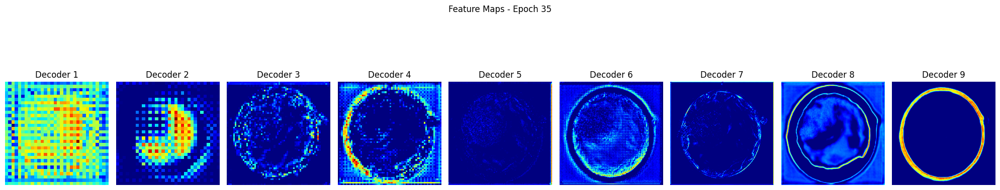

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9722 - dice_coef: 0.6181 - iou: 0.8503 - loss: 0.3819 - precision_1: 0.8667 - recall_1: 0.9794 - val_accuracy: 0.9583 - val_dice_coef: 0.5995 - val_iou: 0.7931 - val_loss: 0.3955 - val_precision_1: 0.8117 - val_recall_1: 0.9715 - learning_rate: 1.0000e-04
Epoch 36/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9719 - dice_coef: 0.6094 - iou: 0.8437 - loss: 0.3905 - precision_1: 0.8586 - recall_1: 0.9817 - val_accuracy: 0.9488 - val_dice_coef: 0.5802 - val_iou: 0.7608 - val_loss: 0.4165 - val_precision_1: 0.7842 - val_recall_1: 0.9504 - learning_rate: 1.0000e-04
Epoch 37/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9733 - dice_coef: 0.6189 - iou: 0.8523 - loss: 0.3812 - precision_1: 0.8666 - recall_1: 0.9828 - val_accuracy: 0.9179 - val_dice_coef: 0.5361 - val_iou: 0.6592 - val_loss: 0.4649 - val_precision_1: 0.6907 - val_recall_1: 0.9071 - learning_rate: 1.0000e-04
Epoch 38/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

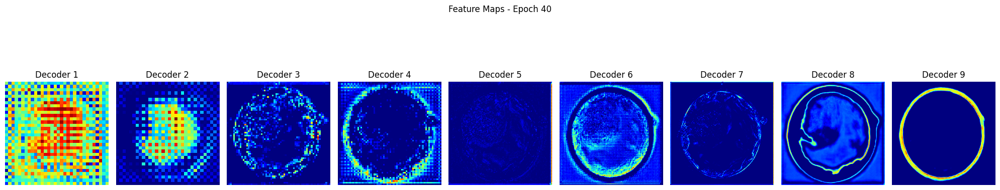

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9737 - dice_coef: 0.6255 - iou: 0.8520 - loss: 0.3745 - precision_1: 0.8661 - recall_1: 0.9824 - val_accuracy: 0.9596 - val_dice_coef: 0.5991 - val_iou: 0.8039 - val_loss: 0.3975 - val_precision_1: 0.8314 - val_recall_1: 0.9464 - learning_rate: 1.0000e-04
Epoch 41/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9763 - dice_coef: 0.6363 - iou: 0.8662 - loss: 0.3637 - precision_1: 0.8802 - recall_1: 0.9831 - val_accuracy: 0.8764 - val_dice_coef: 0.5293 - val_iou: 0.5505 - val_loss: 0.4683 - val_precision_1: 0.5788 - val_recall_1: 0.9127 - learning_rate: 1.0000e-04
Epoch 42/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9756 - dice_coef: 0.6393 - iou: 0.8630 - loss: 0.3607 - precision_1: 0.8767 - recall_1: 0.9830 - val_accuracy: 0.9464 - val_dice_coef: 0.5936 - val_iou: 0.7428 - val_loss: 0.4029 - val_precision_1: 0.7837 - val_recall_1: 0.9309 - learning_rate: 1.0000e-04
Epoch 43/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

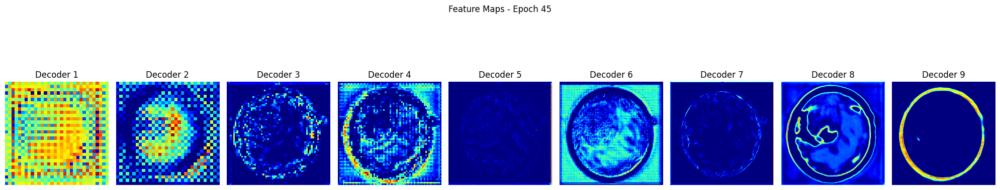

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9768 - dice_coef: 0.6527 - iou: 0.8681 - loss: 0.3473 - precision_1: 0.8858 - recall_1: 0.9793 - val_accuracy: 0.9099 - val_dice_coef: 0.5367 - val_iou: 0.6186 - val_loss: 0.4662 - val_precision_1: 0.6963 - val_recall_1: 0.8018 - learning_rate: 1.0000e-04
Epoch 46/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9777 - dice_coef: 0.6622 - iou: 0.8744 - loss: 0.3378 - precision_1: 0.8892 - recall_1: 0.9830 - val_accuracy: 0.8817 - val_dice_coef: 0.5471 - val_iou: 0.5824 - val_loss: 0.4552 - val_precision_1: 0.5911 - val_recall_1: 0.9103 - learning_rate: 1.0000e-04
Epoch 47/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9700 - dice_coef: 0.6517 - iou: 0.8348 - loss: 0.3483 - precision_1: 0.8587 - recall_1: 0.9679 - val_accuracy: 0.9635 - val_dice_coef: 0.6587 - val_iou: 0.8144 - val_loss: 0.3381 - val_precision_1: 0.8528 - val_recall_1: 0.9403 - learning_rate: 1.0000e-04
Epoch 48/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

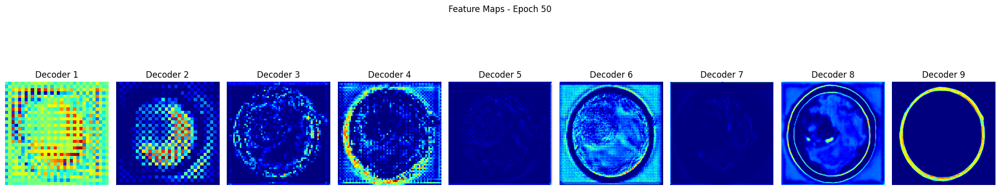

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9783 - dice_coef: 0.6730 - iou: 0.8754 - loss: 0.3268 - precision_1: 0.8914 - recall_1: 0.9811 - val_accuracy: 0.9635 - val_dice_coef: 0.6660 - val_iou: 0.8134 - val_loss: 0.3301 - val_precision_1: 0.8428 - val_recall_1: 0.9566 - learning_rate: 1.0000e-04
Epoch 51/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9786 - dice_coef: 0.6789 - iou: 0.8770 - loss: 0.3211 - precision_1: 0.8936 - recall_1: 0.9807 - val_accuracy: 0.9574 - val_dice_coef: 0.6281 - val_iou: 0.7723 - val_loss: 0.3701 - val_precision_1: 0.8966 - val_recall_1: 0.8375 - learning_rate: 1.0000e-04
Epoch 52/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - accuracy: 0.9798 - dice_coef: 0.6892 - iou: 0.8851 - loss: 0.3109 - precision_1: 0.9021 - recall_1: 0.9802 - val_accuracy: 0.9617 - val_dice_coef: 0.6602 - val_iou: 0.8067 - val_loss: 0.3375 - val_precision_1: 0.8556 - val_recall_1: 0.9228 - learning_rate: 1.0000e-04
Epoch 53/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

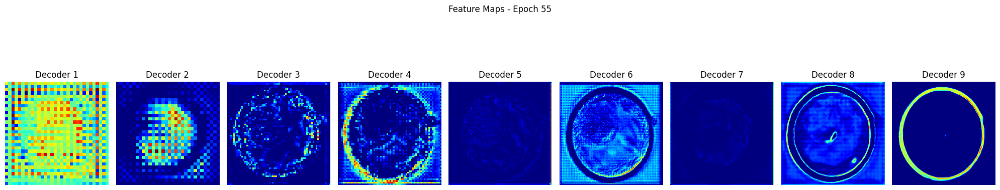

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9799 - dice_coef: 0.6959 - iou: 0.8831 - loss: 0.3041 - precision_1: 0.9012 - recall_1: 0.9799 - val_accuracy: 0.9665 - val_dice_coef: 0.6814 - val_iou: 0.8254 - val_loss: 0.3158 - val_precision_1: 0.8702 - val_recall_1: 0.9357 - learning_rate: 1.0000e-04
Epoch 56/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9811 - dice_coef: 0.7061 - iou: 0.8914 - loss: 0.2939 - precision_1: 0.9081 - recall_1: 0.9808 - val_accuracy: 0.9680 - val_dice_coef: 0.6865 - val_iou: 0.8349 - val_loss: 0.3124 - val_precision_1: 0.8996 - val_recall_1: 0.9069 - learning_rate: 1.0000e-04
Epoch 57/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9822 - dice_coef: 0.7097 - iou: 0.8964 - loss: 0.2903 - precision_1: 0.9142 - recall_1: 0.9802 - val_accuracy: 0.9682 - val_dice_coef: 0.6967 - val_iou: 0.8357 - val_loss: 0.3023 - val_precision_1: 0.8921 - val_recall_1: 0.9174 - learning_rate: 1.0000e-04
Epoch 58/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

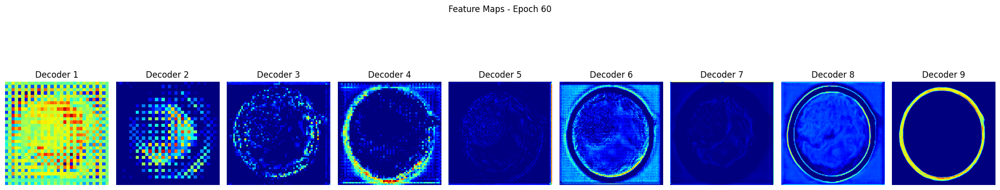

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9818 - dice_coef: 0.7206 - iou: 0.8948 - loss: 0.2794 - precision_1: 0.9120 - recall_1: 0.9801 - val_accuracy: 0.9683 - val_dice_coef: 0.7083 - val_iou: 0.8377 - val_loss: 0.2904 - val_precision_1: 0.8800 - val_recall_1: 0.9348 - learning_rate: 1.0000e-04
Epoch 61/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9823 - dice_coef: 0.7183 - iou: 0.8946 - loss: 0.2818 - precision_1: 0.9129 - recall_1: 0.9793 - val_accuracy: 0.9662 - val_dice_coef: 0.7040 - val_iou: 0.8192 - val_loss: 0.2931 - val_precision_1: 0.8827 - val_recall_1: 0.9164 - learning_rate: 1.0000e-04
Epoch 62/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9830 - dice_coef: 0.7310 - iou: 0.9008 - loss: 0.2690 - precision_1: 0.9195 - recall_1: 0.9795 - val_accuracy: 0.9651 - val_dice_coef: 0.7083 - val_iou: 0.8200 - val_loss: 0.2896 - val_precision_1: 0.8612 - val_recall_1: 0.9389 - learning_rate: 1.0000e-04
Epoch 63/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

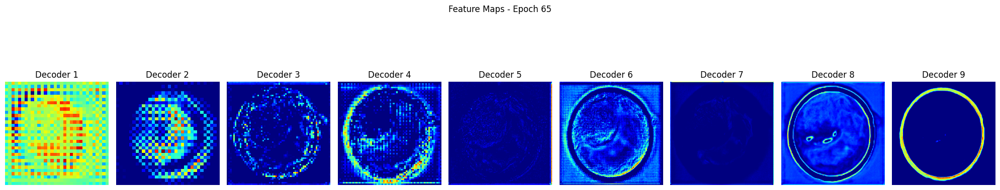

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9827 - dice_coef: 0.7393 - iou: 0.8984 - loss: 0.2607 - precision_1: 0.9180 - recall_1: 0.9779 - val_accuracy: 0.9697 - val_dice_coef: 0.7237 - val_iou: 0.8366 - val_loss: 0.2741 - val_precision_1: 0.9034 - val_recall_1: 0.9135 - learning_rate: 1.0000e-04
Epoch 66/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9833 - dice_coef: 0.7426 - iou: 0.9017 - loss: 0.2574 - precision_1: 0.9204 - recall_1: 0.9784 - val_accuracy: 0.9650 - val_dice_coef: 0.7262 - val_iou: 0.8215 - val_loss: 0.2718 - val_precision_1: 0.8530 - val_recall_1: 0.9510 - learning_rate: 1.0000e-04
Epoch 67/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9826 - dice_coef: 0.7482 - iou: 0.8987 - loss: 0.2518 - precision_1: 0.9163 - recall_1: 0.9799 - val_accuracy: 0.9700 - val_dice_coef: 0.7346 - val_iou: 0.8429 - val_loss: 0.2637 - val_precision_1: 0.8837 - val_recall_1: 0.9412 - learning_rate: 1.0000e-04
Epoch 68/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

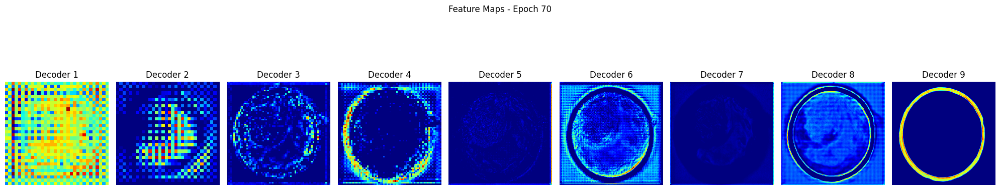

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9841 - dice_coef: 0.7653 - iou: 0.9078 - loss: 0.2347 - precision_1: 0.9259 - recall_1: 0.9799 - val_accuracy: 0.9693 - val_dice_coef: 0.7433 - val_iou: 0.8400 - val_loss: 0.2551 - val_precision_1: 0.8792 - val_recall_1: 0.9428 - learning_rate: 1.0000e-04
Epoch 71/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9846 - dice_coef: 0.7616 - iou: 0.9075 - loss: 0.2384 - precision_1: 0.9269 - recall_1: 0.9787 - val_accuracy: 0.9689 - val_dice_coef: 0.7456 - val_iou: 0.8396 - val_loss: 0.2535 - val_precision_1: 0.8814 - val_recall_1: 0.9371 - learning_rate: 1.0000e-04
Epoch 72/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9842 - dice_coef: 0.7681 - iou: 0.9070 - loss: 0.2320 - precision_1: 0.9258 - recall_1: 0.9788 - val_accuracy: 0.9673 - val_dice_coef: 0.7437 - val_iou: 0.8303 - val_loss: 0.2543 - val_precision_1: 0.8676 - val_recall_1: 0.9455 - learning_rate: 1.0000e-04
Epoch 73/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

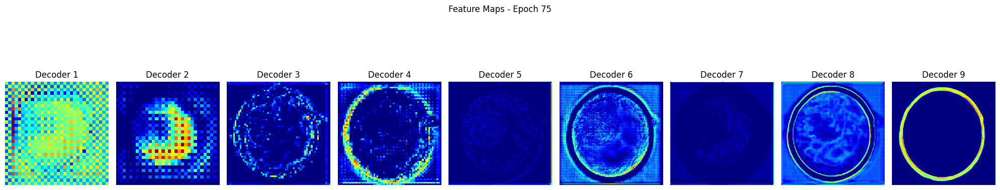

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9860 - dice_coef: 0.7837 - iou: 0.9169 - loss: 0.2163 - precision_1: 0.9355 - recall_1: 0.9799 - val_accuracy: 0.9664 - val_dice_coef: 0.7547 - val_iou: 0.8285 - val_loss: 0.2441 - val_precision_1: 0.8600 - val_recall_1: 0.9504 - learning_rate: 1.0000e-04
Epoch 76/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9855 - dice_coef: 0.7821 - iou: 0.9133 - loss: 0.2179 - precision_1: 0.9325 - recall_1: 0.9790 - val_accuracy: 0.9692 - val_dice_coef: 0.7617 - val_iou: 0.8408 - val_loss: 0.2376 - val_precision_1: 0.8798 - val_recall_1: 0.9410 - learning_rate: 1.0000e-04
Epoch 77/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9854 - dice_coef: 0.7851 - iou: 0.9127 - loss: 0.2149 - precision_1: 0.9298 - recall_1: 0.9810 - val_accuracy: 0.9695 - val_dice_coef: 0.7649 - val_iou: 0.8410 - val_loss: 0.2346 - val_precision_1: 0.8900 - val_recall_1: 0.9292 - learning_rate: 1.0000e-04
Epoch 78/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

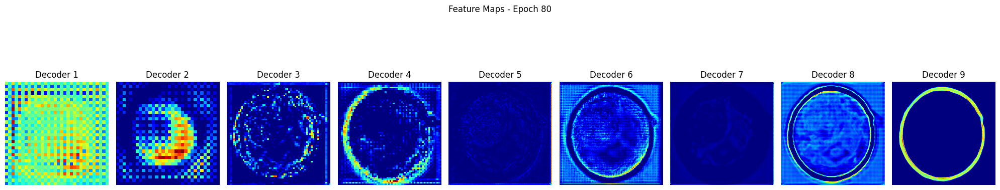

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9869 - dice_coef: 0.8057 - iou: 0.9235 - loss: 0.1943 - precision_1: 0.9420 - recall_1: 0.9800 - val_accuracy: 0.9687 - val_dice_coef: 0.7729 - val_iou: 0.8401 - val_loss: 0.2277 - val_precision_1: 0.8829 - val_recall_1: 0.9333 - learning_rate: 1.0000e-04
Epoch 81/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9873 - dice_coef: 0.8078 - iou: 0.9255 - loss: 0.1922 - precision_1: 0.9423 - recall_1: 0.9815 - val_accuracy: 0.9681 - val_dice_coef: 0.7744 - val_iou: 0.8372 - val_loss: 0.2253 - val_precision_1: 0.8713 - val_recall_1: 0.9459 - learning_rate: 1.0000e-04
Epoch 82/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - accuracy: 0.9869 - dice_coef: 0.8014 - iou: 0.9201 - loss: 0.1986 - precision_1: 0.9384 - recall_1: 0.9800 - val_accuracy: 0.9682 - val_dice_coef: 0.7756 - val_iou: 0.8330 - val_loss: 0.2236 - val_precision_1: 0.8821 - val_recall_1: 0.9310 - learning_rate: 1.0000e-04
Epoch 83/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

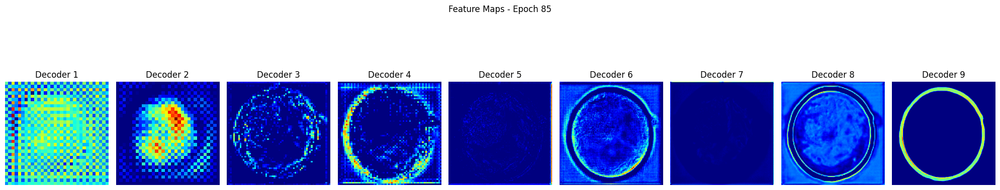

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9875 - dice_coef: 0.8118 - iou: 0.9239 - loss: 0.1882 - precision_1: 0.9415 - recall_1: 0.9809 - val_accuracy: 0.9685 - val_dice_coef: 0.7863 - val_iou: 0.8369 - val_loss: 0.2136 - val_precision_1: 0.8771 - val_recall_1: 0.9401 - learning_rate: 1.0000e-04
Epoch 86/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9868 - dice_coef: 0.8183 - iou: 0.9215 - loss: 0.1816 - precision_1: 0.9393 - recall_1: 0.9804 - val_accuracy: 0.9695 - val_dice_coef: 0.7882 - val_iou: 0.8424 - val_loss: 0.2138 - val_precision_1: 0.9081 - val_recall_1: 0.9063 - learning_rate: 1.0000e-04
Epoch 87/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9862 - dice_coef: 0.8159 - iou: 0.9171 - loss: 0.1841 - precision_1: 0.9356 - recall_1: 0.9791 - val_accuracy: 0.9696 - val_dice_coef: 0.7883 - val_iou: 0.8426 - val_loss: 0.2143 - val_precision_1: 0.9151 - val_recall_1: 0.8985 - learning_rate: 1.0000e-04
Epoch 88/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

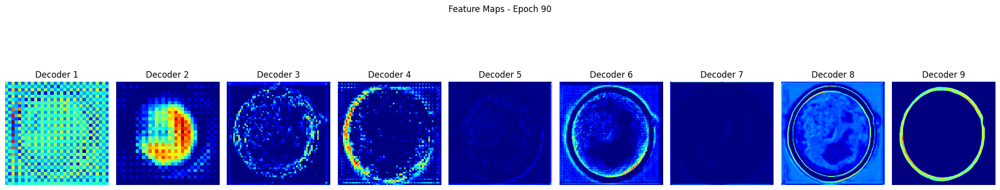

63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9857 - dice_coef: 0.8262 - iou: 0.9147 - loss: 0.1737 - precision_1: 0.9347 - recall_1: 0.9778 - val_accuracy: 0.9690 - val_dice_coef: 0.7988 - val_iou: 0.8415 - val_loss: 0.2027 - val_precision_1: 0.8855 - val_recall_1: 0.9318 - learning_rate: 1.0000e-04
Epoch 91/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9877 - dice_coef: 0.8308 - iou: 0.9254 - loss: 0.1692 - precision_1: 0.9451 - recall_1: 0.9786 - val_accuracy: 0.9716 - val_dice_coef: 0.8069 - val_iou: 0.8534 - val_loss: 0.1938 - val_precision_1: 0.8902 - val_recall_1: 0.9434 - learning_rate: 1.0000e-04
Epoch 92/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9883 - dice_coef: 0.8380 - iou: 0.9293 - loss: 0.1620 - precision_1: 0.9490 - recall_1: 0.9789 - val_accuracy: 0.9687 - val_dice_coef: 0.8042 - val_iou: 0.8385 - val_loss: 0.1958 - val_precision_1: 0.8733 - val_recall_1: 0.9473 - learning_rate: 1.0000e-04
Epoch 93/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

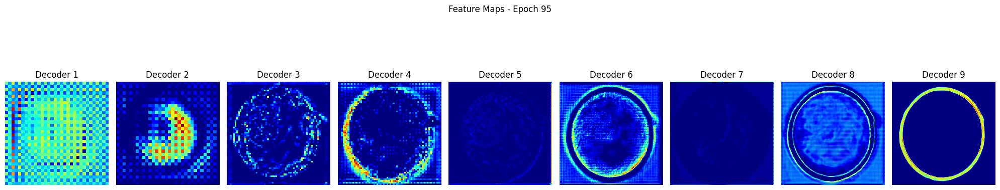

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9888 - dice_coef: 0.8428 - iou: 0.9311 - loss: 0.1572 - precision_1: 0.9500 - recall_1: 0.9797 - val_accuracy: 0.9716 - val_dice_coef: 0.8156 - val_iou: 0.8507 - val_loss: 0.1846 - val_precision_1: 0.8914 - val_recall_1: 0.9419 - learning_rate: 1.0000e-04
Epoch 96/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9893 - dice_coef: 0.8491 - iou: 0.9351 - loss: 0.1509 - precision_1: 0.9535 - recall_1: 0.9803 - val_accuracy: 0.9691 - val_dice_coef: 0.8140 - val_iou: 0.8415 - val_loss: 0.1865 - val_precision_1: 0.8741 - val_recall_1: 0.9490 - learning_rate: 1.0000e-04
Epoch 97/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9893 - dice_coef: 0.8541 - iou: 0.9358 - loss: 0.1459 - precision_1: 0.9538 - recall_1: 0.9811 - val_accuracy: 0.9704 - val_dice_coef: 0.8188 - val_iou: 0.8479 - val_loss: 0.1824 - val_precision_1: 0.8857 - val_recall_1: 0.9417 - learning_rate: 1.0000e-04
Epoch 98/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s

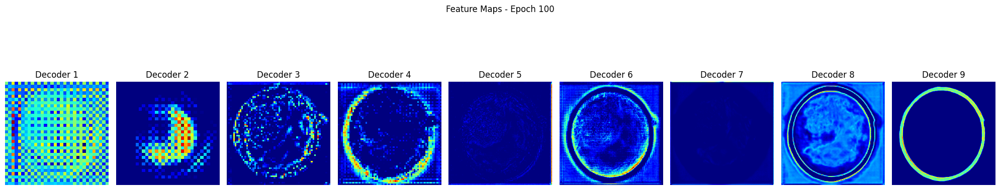

63/63 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.9894 - dice_coef: 0.8586 - iou: 0.9354 - loss: 0.1414 - precision_1: 0.9553 - recall_1: 0.9788 - val_accuracy: 0.9692 - val_dice_coef: 0.8214 - val_iou: 0.8402 - val_loss: 0.1789 - val_precision_1: 0.8768 - val_recall_1: 0.9456 - learning_rate: 1.0000e-04
Epoch 101/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9888 - dice_coef: 0.8624 - iou: 0.9328 - loss: 0.1377 - precision_1: 0.9518 - recall_1: 0.9795 - val_accuracy: 0.9672 - val_dice_coef: 0.8178 - val_iou: 0.8315 - val_loss: 0.1829 - val_precision_1: 0.8702 - val_recall_1: 0.9406 - learning_rate: 1.0000e-04
Epoch 102/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9875 - dice_coef: 0.8557 - iou: 0.9227 - loss: 0.1443 - precision_1: 0.9443 - recall_1: 0.9769 - val_accuracy: 0.9336 - val_dice_coef: 0.6995 - val_iou: 0.6391 - val_loss: 0.3104 - val_precision_1: 0.9221 - val_recall_1: 0.6510 - learning_rate: 1.0000e-04
Epoch 103/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

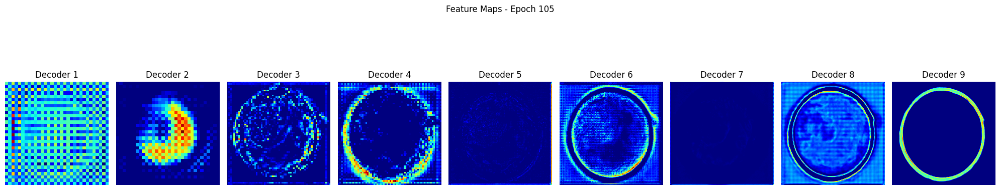

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9897 - dice_coef: 0.8722 - iou: 0.9378 - loss: 0.1278 - precision_1: 0.9587 - recall_1: 0.9778 - val_accuracy: 0.9694 - val_dice_coef: 0.8312 - val_iou: 0.8423 - val_loss: 0.1705 - val_precision_1: 0.8867 - val_recall_1: 0.9331 - learning_rate: 1.0000e-04
Epoch 106/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9899 - dice_coef: 0.8715 - iou: 0.9377 - loss: 0.1285 - precision_1: 0.9558 - recall_1: 0.9808 - val_accuracy: 0.9708 - val_dice_coef: 0.8346 - val_iou: 0.8461 - val_loss: 0.1667 - val_precision_1: 0.8994 - val_recall_1: 0.9257 - learning_rate: 1.0000e-04
Epoch 107/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9903 - dice_coef: 0.8744 - iou: 0.9398 - loss: 0.1256 - precision_1: 0.9585 - recall_1: 0.9800 - val_accuracy: 0.9719 - val_dice_coef: 0.8389 - val_iou: 0.8513 - val_loss: 0.1621 - val_precision_1: 0.9011 - val_recall_1: 0.9312 - learning_rate: 1.0000e-04
Epoch 108/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

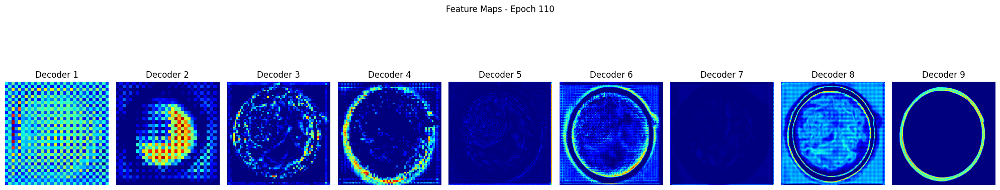

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9906 - dice_coef: 0.8805 - iou: 0.9415 - loss: 0.1194 - precision_1: 0.9595 - recall_1: 0.9809 - val_accuracy: 0.9712 - val_dice_coef: 0.8438 - val_iou: 0.8505 - val_loss: 0.1577 - val_precision_1: 0.8910 - val_recall_1: 0.9400 - learning_rate: 1.0000e-04
Epoch 111/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9908 - dice_coef: 0.8838 - iou: 0.9431 - loss: 0.1162 - precision_1: 0.9607 - recall_1: 0.9813 - val_accuracy: 0.9722 - val_dice_coef: 0.8467 - val_iou: 0.8542 - val_loss: 0.1554 - val_precision_1: 0.9083 - val_recall_1: 0.9242 - learning_rate: 1.0000e-04
Epoch 112/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9908 - dice_coef: 0.8847 - iou: 0.9426 - loss: 0.1153 - precision_1: 0.9622 - recall_1: 0.9798 - val_accuracy: 0.9689 - val_dice_coef: 0.8371 - val_iou: 0.8357 - val_loss: 0.1663 - val_precision_1: 0.9199 - val_recall_1: 0.8881 - learning_rate: 1.0000e-04
Epoch 113/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

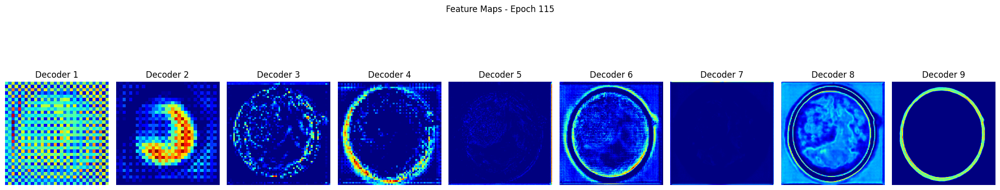

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9909 - dice_coef: 0.8933 - iou: 0.9441 - loss: 0.1067 - precision_1: 0.9624 - recall_1: 0.9807 - val_accuracy: 0.9715 - val_dice_coef: 0.8521 - val_iou: 0.8518 - val_loss: 0.1503 - val_precision_1: 0.9014 - val_recall_1: 0.9281 - learning_rate: 1.0000e-04
Epoch 116/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9907 - dice_coef: 0.8932 - iou: 0.9425 - loss: 0.1068 - precision_1: 0.9619 - recall_1: 0.9796 - val_accuracy: 0.9718 - val_dice_coef: 0.8540 - val_iou: 0.8522 - val_loss: 0.1478 - val_precision_1: 0.9009 - val_recall_1: 0.9311 - learning_rate: 1.0000e-04
Epoch 117/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9910 - dice_coef: 0.8977 - iou: 0.9452 - loss: 0.1022 - precision_1: 0.9626 - recall_1: 0.9815 - val_accuracy: 0.9710 - val_dice_coef: 0.8545 - val_iou: 0.8492 - val_loss: 0.1473 - val_precision_1: 0.8914 - val_recall_1: 0.9381 - learning_rate: 1.0000e-04
Epoch 118/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

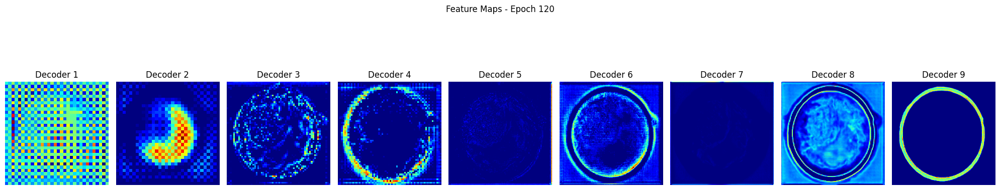

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9912 - dice_coef: 0.9001 - iou: 0.9452 - loss: 0.0999 - precision_1: 0.9641 - recall_1: 0.9800 - val_accuracy: 0.9713 - val_dice_coef: 0.8563 - val_iou: 0.8477 - val_loss: 0.1455 - val_precision_1: 0.9060 - val_recall_1: 0.9208 - learning_rate: 1.0000e-04
Epoch 121/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9912 - dice_coef: 0.9021 - iou: 0.9452 - loss: 0.0979 - precision_1: 0.9628 - recall_1: 0.9814 - val_accuracy: 0.9701 - val_dice_coef: 0.8571 - val_iou: 0.8444 - val_loss: 0.1448 - val_precision_1: 0.8898 - val_recall_1: 0.9338 - learning_rate: 1.0000e-04
Epoch 122/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9913 - dice_coef: 0.9058 - iou: 0.9463 - loss: 0.0942 - precision_1: 0.9644 - recall_1: 0.9811 - val_accuracy: 0.9707 - val_dice_coef: 0.8602 - val_iou: 0.8480 - val_loss: 0.1416 - val_precision_1: 0.8893 - val_recall_1: 0.9388 - learning_rate: 1.0000e-04
Epoch 123/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

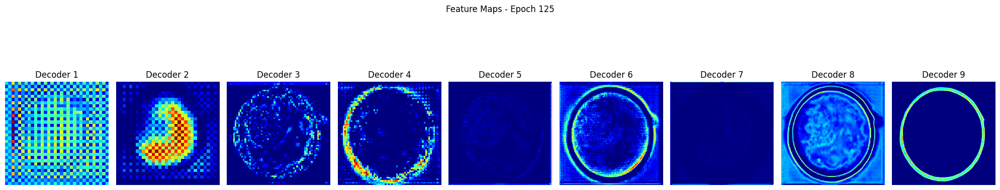

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9911 - dice_coef: 0.9080 - iou: 0.9450 - loss: 0.0920 - precision_1: 0.9634 - recall_1: 0.9807 - val_accuracy: 0.9697 - val_dice_coef: 0.8622 - val_iou: 0.8433 - val_loss: 0.1395 - val_precision_1: 0.8810 - val_recall_1: 0.9433 - learning_rate: 1.0000e-04
Epoch 126/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9915 - dice_coef: 0.9135 - iou: 0.9484 - loss: 0.0864 - precision_1: 0.9656 - recall_1: 0.9821 - val_accuracy: 0.9719 - val_dice_coef: 0.8675 - val_iou: 0.8526 - val_loss: 0.1341 - val_precision_1: 0.8935 - val_recall_1: 0.9410 - learning_rate: 1.0000e-04
Epoch 127/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9913 - dice_coef: 0.9130 - iou: 0.9467 - loss: 0.0870 - precision_1: 0.9652 - recall_1: 0.9807 - val_accuracy: 0.9730 - val_dice_coef: 0.8712 - val_iou: 0.8579 - val_loss: 0.1308 - val_precision_1: 0.9070 - val_recall_1: 0.9316 - learning_rate: 1.0000e-04
Epoch 128/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

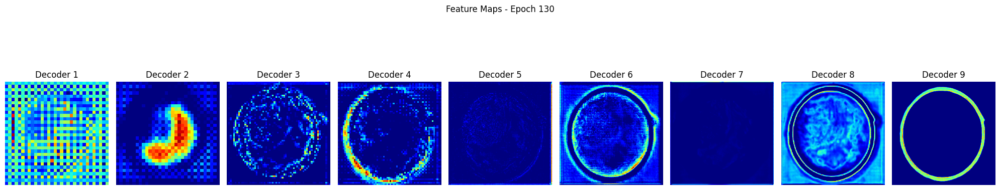

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9917 - dice_coef: 0.9178 - iou: 0.9489 - loss: 0.0822 - precision_1: 0.9681 - recall_1: 0.9800 - val_accuracy: 0.9736 - val_dice_coef: 0.8750 - val_iou: 0.8589 - val_loss: 0.1268 - val_precision_1: 0.9130 - val_recall_1: 0.9276 - learning_rate: 1.0000e-04
Epoch 131/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9914 - dice_coef: 0.9167 - iou: 0.9464 - loss: 0.0833 - precision_1: 0.9672 - recall_1: 0.9787 - val_accuracy: 0.9711 - val_dice_coef: 0.8708 - val_iou: 0.8479 - val_loss: 0.1308 - val_precision_1: 0.8940 - val_recall_1: 0.9353 - learning_rate: 1.0000e-04
Epoch 132/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9919 - dice_coef: 0.9184 - iou: 0.9492 - loss: 0.0816 - precision_1: 0.9679 - recall_1: 0.9807 - val_accuracy: 0.9707 - val_dice_coef: 0.8715 - val_iou: 0.8471 - val_loss: 0.1309 - val_precision_1: 0.8955 - val_recall_1: 0.9304 - learning_rate: 1.0000e-04
Epoch 133/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

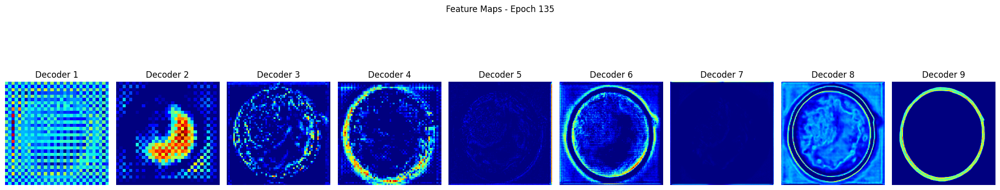

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9901 - dice_coef: 0.9172 - iou: 0.9381 - loss: 0.0828 - precision_1: 0.9604 - recall_1: 0.9764 - val_accuracy: 0.9684 - val_dice_coef: 0.8666 - val_iou: 0.8334 - val_loss: 0.1355 - val_precision_1: 0.8937 - val_recall_1: 0.9167 - learning_rate: 1.0000e-04
Epoch 136/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9914 - dice_coef: 0.9209 - iou: 0.9455 - loss: 0.0791 - precision_1: 0.9662 - recall_1: 0.9784 - val_accuracy: 0.9688 - val_dice_coef: 0.8700 - val_iou: 0.8365 - val_loss: 0.1320 - val_precision_1: 0.8867 - val_recall_1: 0.9287 - learning_rate: 1.0000e-04
Epoch 137/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9917 - dice_coef: 0.9264 - iou: 0.9487 - loss: 0.0736 - precision_1: 0.9679 - recall_1: 0.9801 - val_accuracy: 0.9713 - val_dice_coef: 0.8780 - val_iou: 0.8500 - val_loss: 0.1242 - val_precision_1: 0.8945 - val_recall_1: 0.9360 - learning_rate: 1.0000e-04
Epoch 138/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

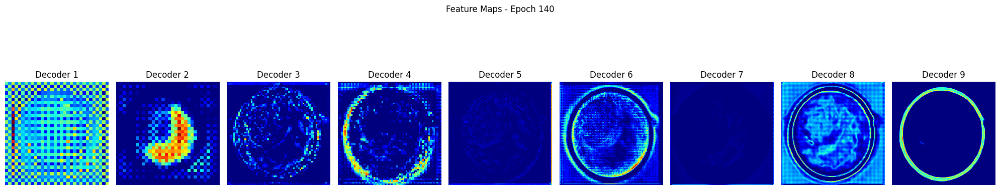

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9919 - dice_coef: 0.9292 - iou: 0.9499 - loss: 0.0708 - precision_1: 0.9683 - recall_1: 0.9810 - val_accuracy: 0.9705 - val_dice_coef: 0.8772 - val_iou: 0.8440 - val_loss: 0.1252 - val_precision_1: 0.9015 - val_recall_1: 0.9212 - learning_rate: 1.0000e-04
Epoch 141/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9925 - dice_coef: 0.9341 - iou: 0.9548 - loss: 0.0659 - precision_1: 0.9724 - recall_1: 0.9817 - val_accuracy: 0.9713 - val_dice_coef: 0.8809 - val_iou: 0.8492 - val_loss: 0.1218 - val_precision_1: 0.9034 - val_recall_1: 0.9245 - learning_rate: 1.0000e-04
Epoch 142/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9924 - dice_coef: 0.9324 - iou: 0.9530 - loss: 0.0676 - precision_1: 0.9708 - recall_1: 0.9816 - val_accuracy: 0.9707 - val_dice_coef: 0.8816 - val_iou: 0.8480 - val_loss: 0.1207 - val_precision_1: 0.8864 - val_recall_1: 0.9425 - learning_rate: 1.0000e-04
Epoch 143/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

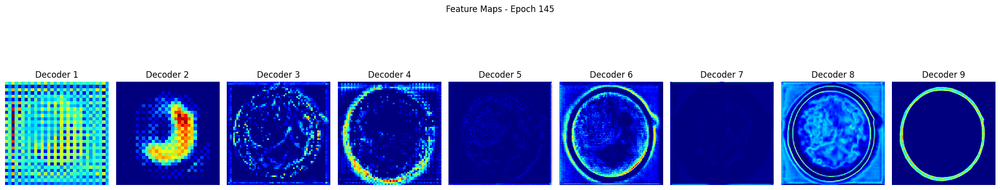

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9922 - dice_coef: 0.9368 - iou: 0.9527 - loss: 0.0632 - precision_1: 0.9706 - recall_1: 0.9814 - val_accuracy: 0.9721 - val_dice_coef: 0.8857 - val_iou: 0.8523 - val_loss: 0.1164 - val_precision_1: 0.9028 - val_recall_1: 0.9305 - learning_rate: 1.0000e-04
Epoch 146/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9927 - dice_coef: 0.9364 - iou: 0.9541 - loss: 0.0636 - precision_1: 0.9726 - recall_1: 0.9808 - val_accuracy: 0.9721 - val_dice_coef: 0.8860 - val_iou: 0.8519 - val_loss: 0.1164 - val_precision_1: 0.9065 - val_recall_1: 0.9256 - learning_rate: 1.0000e-04
Epoch 147/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9928 - dice_coef: 0.9401 - iou: 0.9562 - loss: 0.0599 - precision_1: 0.9739 - recall_1: 0.9819 - val_accuracy: 0.9718 - val_dice_coef: 0.8861 - val_iou: 0.8505 - val_loss: 0.1161 - val_precision_1: 0.9032 - val_recall_1: 0.9283 - learning_rate: 1.0000e-04
Epoch 148/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

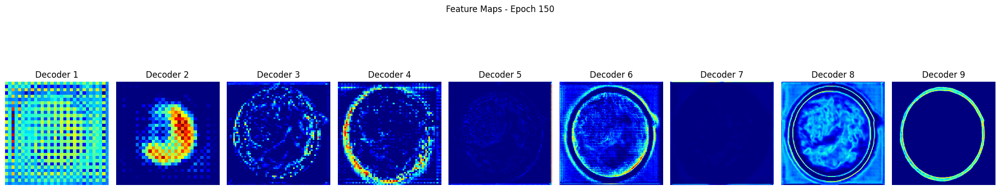

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9924 - dice_coef: 0.9405 - iou: 0.9534 - loss: 0.0595 - precision_1: 0.9724 - recall_1: 0.9803 - val_accuracy: 0.9726 - val_dice_coef: 0.8903 - val_iou: 0.8550 - val_loss: 0.1122 - val_precision_1: 0.9064 - val_recall_1: 0.9291 - learning_rate: 1.0000e-04
Epoch 151/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9923 - dice_coef: 0.9399 - iou: 0.9520 - loss: 0.0600 - precision_1: 0.9707 - recall_1: 0.9808 - val_accuracy: 0.9693 - val_dice_coef: 0.8838 - val_iou: 0.8406 - val_loss: 0.1186 - val_precision_1: 0.8846 - val_recall_1: 0.9356 - learning_rate: 1.0000e-04
Epoch 152/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9907 - dice_coef: 0.9381 - iou: 0.9438 - loss: 0.0619 - precision_1: 0.9639 - recall_1: 0.9788 - val_accuracy: 0.9704 - val_dice_coef: 0.8881 - val_iou: 0.8468 - val_loss: 0.1149 - val_precision_1: 0.8896 - val_recall_1: 0.9360 - learning_rate: 1.0000e-04
Epoch 153/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

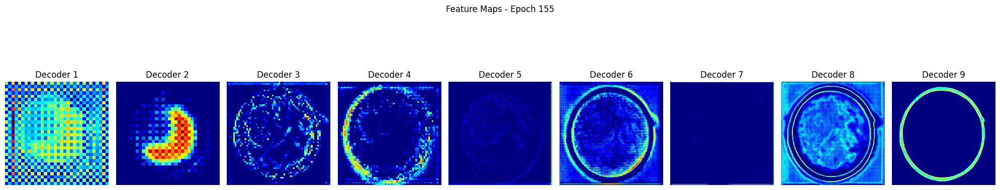

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9927 - dice_coef: 0.9443 - iou: 0.9545 - loss: 0.0557 - precision_1: 0.9740 - recall_1: 0.9799 - val_accuracy: 0.9704 - val_dice_coef: 0.8887 - val_iou: 0.8450 - val_loss: 0.1144 - val_precision_1: 0.8983 - val_recall_1: 0.9244 - learning_rate: 1.0000e-04
Epoch 156/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9932 - dice_coef: 0.9476 - iou: 0.9579 - loss: 0.0524 - precision_1: 0.9751 - recall_1: 0.9821 - val_accuracy: 0.9725 - val_dice_coef: 0.8947 - val_iou: 0.8549 - val_loss: 0.1081 - val_precision_1: 0.9078 - val_recall_1: 0.9271 - learning_rate: 1.0000e-04
Epoch 157/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9931 - dice_coef: 0.9468 - iou: 0.9570 - loss: 0.0532 - precision_1: 0.9745 - recall_1: 0.9819 - val_accuracy: 0.9715 - val_dice_coef: 0.8941 - val_iou: 0.8517 - val_loss: 0.1085 - val_precision_1: 0.8916 - val_recall_1: 0.9413 - learning_rate: 1.0000e-04
Epoch 158/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

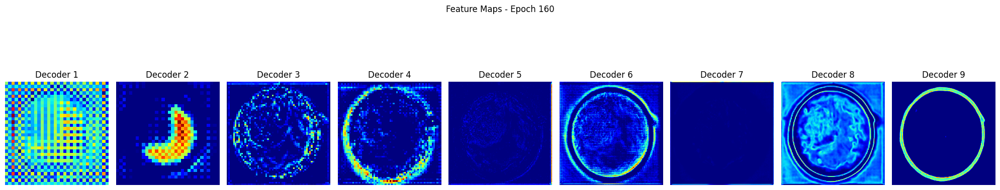

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9925 - dice_coef: 0.9473 - iou: 0.9534 - loss: 0.0527 - precision_1: 0.9734 - recall_1: 0.9793 - val_accuracy: 0.9728 - val_dice_coef: 0.8984 - val_iou: 0.8569 - val_loss: 0.1047 - val_precision_1: 0.9070 - val_recall_1: 0.9298 - learning_rate: 1.0000e-04
Epoch 161/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9929 - dice_coef: 0.9498 - iou: 0.9562 - loss: 0.0502 - precision_1: 0.9746 - recall_1: 0.9810 - val_accuracy: 0.9687 - val_dice_coef: 0.8870 - val_iou: 0.8353 - val_loss: 0.1151 - val_precision_1: 0.8856 - val_recall_1: 0.9294 - learning_rate: 1.0000e-04
Epoch 162/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9928 - dice_coef: 0.9504 - iou: 0.9557 - loss: 0.0495 - precision_1: 0.9729 - recall_1: 0.9823 - val_accuracy: 0.9728 - val_dice_coef: 0.8982 - val_iou: 0.8561 - val_loss: 0.1050 - val_precision_1: 0.9135 - val_recall_1: 0.9217 - learning_rate: 1.0000e-04
Epoch 163/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

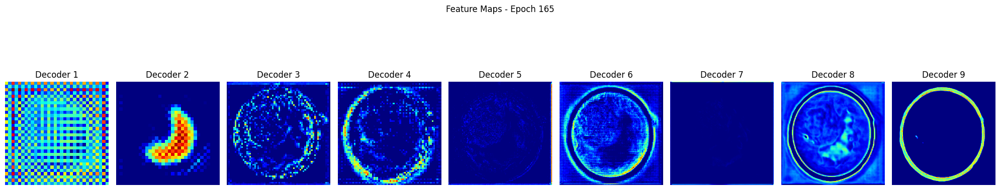

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9923 - dice_coef: 0.9503 - iou: 0.9525 - loss: 0.0497 - precision_1: 0.9704 - recall_1: 0.9814 - val_accuracy: 0.9723 - val_dice_coef: 0.8987 - val_iou: 0.8533 - val_loss: 0.1045 - val_precision_1: 0.9103 - val_recall_1: 0.9222 - learning_rate: 1.0000e-04
Epoch 166/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9929 - dice_coef: 0.9514 - iou: 0.9551 - loss: 0.0486 - precision_1: 0.9733 - recall_1: 0.9811 - val_accuracy: 0.9712 - val_dice_coef: 0.8967 - val_iou: 0.8481 - val_loss: 0.1056 - val_precision_1: 0.8970 - val_recall_1: 0.9321 - learning_rate: 1.0000e-04
Epoch 167/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9929 - dice_coef: 0.9535 - iou: 0.9563 - loss: 0.0465 - precision_1: 0.9756 - recall_1: 0.9801 - val_accuracy: 0.9719 - val_dice_coef: 0.8985 - val_iou: 0.8507 - val_loss: 0.1039 - val_precision_1: 0.9022 - val_recall_1: 0.9296 - learning_rate: 1.0000e-04
Epoch 168/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

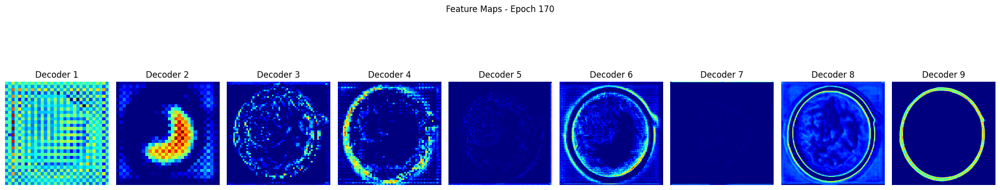

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9935 - dice_coef: 0.9572 - iou: 0.9599 - loss: 0.0428 - precision_1: 0.9765 - recall_1: 0.9831 - val_accuracy: 0.9715 - val_dice_coef: 0.9001 - val_iou: 0.8506 - val_loss: 0.1024 - val_precision_1: 0.8938 - val_recall_1: 0.9385 - learning_rate: 1.0000e-04
Epoch 171/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9936 - dice_coef: 0.9582 - iou: 0.9607 - loss: 0.0418 - precision_1: 0.9761 - recall_1: 0.9841 - val_accuracy: 0.9723 - val_dice_coef: 0.9019 - val_iou: 0.8536 - val_loss: 0.1010 - val_precision_1: 0.9058 - val_recall_1: 0.9281 - learning_rate: 1.0000e-04
Epoch 172/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9934 - dice_coef: 0.9574 - iou: 0.9589 - loss: 0.0426 - precision_1: 0.9769 - recall_1: 0.9815 - val_accuracy: 0.9723 - val_dice_coef: 0.9017 - val_iou: 0.8528 - val_loss: 0.1013 - val_precision_1: 0.9096 - val_recall_1: 0.9230 - learning_rate: 1.0000e-04
Epoch 173/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

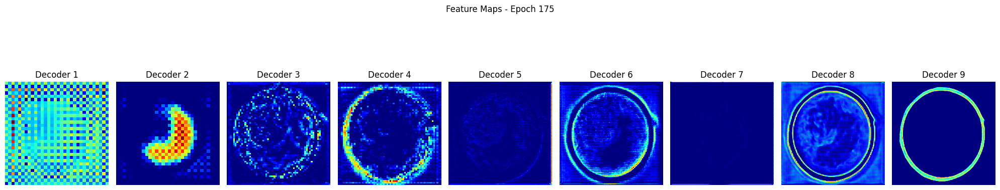

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9936 - dice_coef: 0.9580 - iou: 0.9591 - loss: 0.0420 - precision_1: 0.9770 - recall_1: 0.9816 - val_accuracy: 0.9719 - val_dice_coef: 0.9028 - val_iou: 0.8519 - val_loss: 0.0999 - val_precision_1: 0.9011 - val_recall_1: 0.9314 - learning_rate: 1.0000e-04
Epoch 176/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9940 - dice_coef: 0.9618 - iou: 0.9632 - loss: 0.0382 - precision_1: 0.9791 - recall_1: 0.9837 - val_accuracy: 0.9714 - val_dice_coef: 0.9026 - val_iou: 0.8502 - val_loss: 0.0994 - val_precision_1: 0.8871 - val_recall_1: 0.9468 - learning_rate: 1.0000e-04
Epoch 177/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9936 - dice_coef: 0.9600 - iou: 0.9602 - loss: 0.0400 - precision_1: 0.9764 - recall_1: 0.9834 - val_accuracy: 0.9724 - val_dice_coef: 0.9054 - val_iou: 0.8548 - val_loss: 0.0974 - val_precision_1: 0.9011 - val_recall_1: 0.9350 - learning_rate: 1.0000e-04
Epoch 178/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

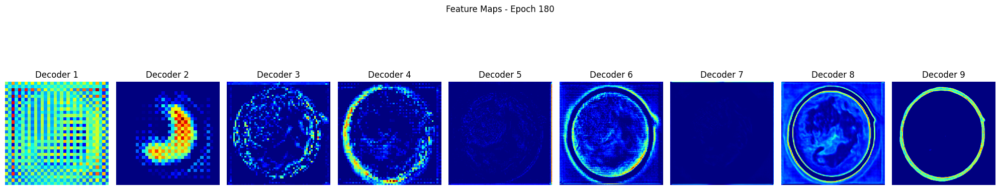

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9938 - dice_coef: 0.9613 - iou: 0.9608 - loss: 0.0387 - precision_1: 0.9778 - recall_1: 0.9826 - val_accuracy: 0.9733 - val_dice_coef: 0.9082 - val_iou: 0.8586 - val_loss: 0.0948 - val_precision_1: 0.9088 - val_recall_1: 0.9309 - learning_rate: 1.0000e-04
Epoch 181/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9929 - dice_coef: 0.9593 - iou: 0.9557 - loss: 0.0407 - precision_1: 0.9755 - recall_1: 0.9796 - val_accuracy: 0.9724 - val_dice_coef: 0.9063 - val_iou: 0.8542 - val_loss: 0.0966 - val_precision_1: 0.9047 - val_recall_1: 0.9301 - learning_rate: 1.0000e-04
Epoch 182/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9933 - dice_coef: 0.9607 - iou: 0.9579 - loss: 0.0393 - precision_1: 0.9771 - recall_1: 0.9803 - val_accuracy: 0.9724 - val_dice_coef: 0.9070 - val_iou: 0.8546 - val_loss: 0.0957 - val_precision_1: 0.8991 - val_recall_1: 0.9371 - learning_rate: 1.0000e-04
Epoch 183/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

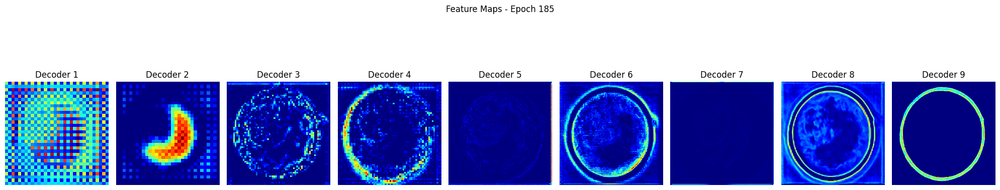

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9935 - dice_coef: 0.9639 - iou: 0.9602 - loss: 0.0361 - precision_1: 0.9787 - recall_1: 0.9811 - val_accuracy: 0.9731 - val_dice_coef: 0.9092 - val_iou: 0.8570 - val_loss: 0.0936 - val_precision_1: 0.9070 - val_recall_1: 0.9316 - learning_rate: 1.0000e-04
Epoch 186/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9938 - dice_coef: 0.9631 - iou: 0.9605 - loss: 0.0369 - precision_1: 0.9775 - recall_1: 0.9828 - val_accuracy: 0.9718 - val_dice_coef: 0.9065 - val_iou: 0.8512 - val_loss: 0.0959 - val_precision_1: 0.8946 - val_recall_1: 0.9388 - learning_rate: 1.0000e-04
Epoch 187/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9937 - dice_coef: 0.9647 - iou: 0.9607 - loss: 0.0353 - precision_1: 0.9774 - recall_1: 0.9829 - val_accuracy: 0.9717 - val_dice_coef: 0.9054 - val_iou: 0.8495 - val_loss: 0.0974 - val_precision_1: 0.9069 - val_recall_1: 0.9226 - learning_rate: 1.0000e-04
Epoch 188/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

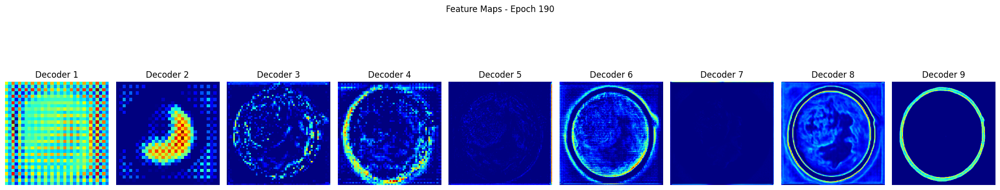

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9937 - dice_coef: 0.9651 - iou: 0.9607 - loss: 0.0349 - precision_1: 0.9790 - recall_1: 0.9814 - val_accuracy: 0.9722 - val_dice_coef: 0.9090 - val_iou: 0.8539 - val_loss: 0.0940 - val_precision_1: 0.8989 - val_recall_1: 0.9360 - learning_rate: 1.0000e-04
Epoch 191/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9940 - dice_coef: 0.9672 - iou: 0.9626 - loss: 0.0328 - precision_1: 0.9800 - recall_1: 0.9821 - val_accuracy: 0.9724 - val_dice_coef: 0.9088 - val_iou: 0.8529 - val_loss: 0.0929 - val_precision_1: 0.8959 - val_recall_1: 0.9413 - learning_rate: 1.0000e-04
Epoch 192/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9941 - dice_coef: 0.9671 - iou: 0.9628 - loss: 0.0329 - precision_1: 0.9791 - recall_1: 0.9832 - val_accuracy: 0.9727 - val_dice_coef: 0.9107 - val_iou: 0.8559 - val_loss: 0.0921 - val_precision_1: 0.9020 - val_recall_1: 0.9356 - learning_rate: 1.0000e-04
Epoch 193/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

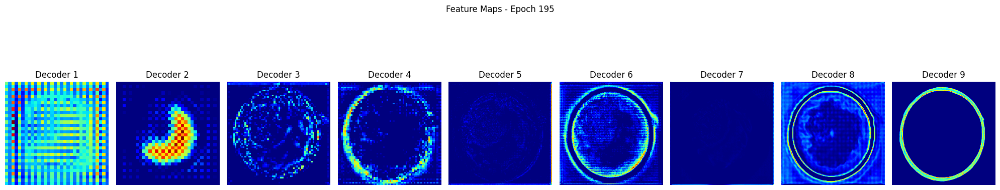

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9934 - dice_coef: 0.9669 - iou: 0.9593 - loss: 0.0331 - precision_1: 0.9772 - recall_1: 0.9815 - val_accuracy: 0.9734 - val_dice_coef: 0.9138 - val_iou: 0.8601 - val_loss: 0.0895 - val_precision_1: 0.9054 - val_recall_1: 0.9358 - learning_rate: 1.0000e-04
Epoch 196/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9939 - dice_coef: 0.9675 - iou: 0.9615 - loss: 0.0325 - precision_1: 0.9784 - recall_1: 0.9827 - val_accuracy: 0.9736 - val_dice_coef: 0.9140 - val_iou: 0.8600 - val_loss: 0.0888 - val_precision_1: 0.9077 - val_recall_1: 0.9346 - learning_rate: 1.0000e-04
Epoch 197/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9940 - dice_coef: 0.9688 - iou: 0.9628 - loss: 0.0312 - precision_1: 0.9800 - recall_1: 0.9823 - val_accuracy: 0.9721 - val_dice_coef: 0.9108 - val_iou: 0.8537 - val_loss: 0.0923 - val_precision_1: 0.8980 - val_recall_1: 0.9367 - learning_rate: 1.0000e-04
Epoch 198/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

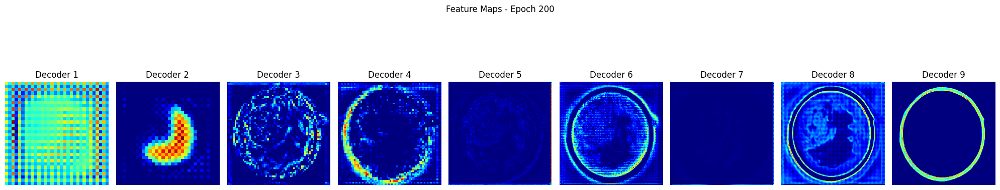

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9940 - dice_coef: 0.9696 - iou: 0.9628 - loss: 0.0304 - precision_1: 0.9793 - recall_1: 0.9829 - val_accuracy: 0.9726 - val_dice_coef: 0.9118 - val_iou: 0.8542 - val_loss: 0.0906 - val_precision_1: 0.9023 - val_recall_1: 0.9346 - learning_rate: 1.0000e-04
Epoch 201/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9942 - dice_coef: 0.9697 - iou: 0.9633 - loss: 0.0303 - precision_1: 0.9789 - recall_1: 0.9840 - val_accuracy: 0.9734 - val_dice_coef: 0.9146 - val_iou: 0.8589 - val_loss: 0.0883 - val_precision_1: 0.9082 - val_recall_1: 0.9325 - learning_rate: 1.0000e-04
Epoch 202/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9944 - dice_coef: 0.9711 - iou: 0.9649 - loss: 0.0289 - precision_1: 0.9809 - recall_1: 0.9837 - val_accuracy: 0.9735 - val_dice_coef: 0.9147 - val_iou: 0.8590 - val_loss: 0.0886 - val_precision_1: 0.9172 - val_recall_1: 0.9223 - learning_rate: 1.0000e-04
Epoch 203/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

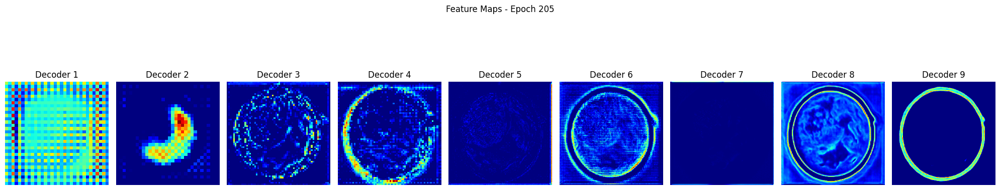

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9937 - dice_coef: 0.9705 - iou: 0.9612 - loss: 0.0295 - precision_1: 0.9781 - recall_1: 0.9826 - val_accuracy: 0.9722 - val_dice_coef: 0.9118 - val_iou: 0.8523 - val_loss: 0.0902 - val_precision_1: 0.8966 - val_recall_1: 0.9394 - learning_rate: 1.0000e-04
Epoch 206/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9931 - dice_coef: 0.9685 - iou: 0.9573 - loss: 0.0315 - precision_1: 0.9751 - recall_1: 0.9816 - val_accuracy: 0.9713 - val_dice_coef: 0.9101 - val_iou: 0.8494 - val_loss: 0.0929 - val_precision_1: 0.8963 - val_recall_1: 0.9333 - learning_rate: 1.0000e-04
Epoch 207/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9937 - dice_coef: 0.9699 - iou: 0.9602 - loss: 0.0301 - precision_1: 0.9770 - recall_1: 0.9827 - val_accuracy: 0.9710 - val_dice_coef: 0.9096 - val_iou: 0.8478 - val_loss: 0.0930 - val_precision_1: 0.8903 - val_recall_1: 0.9394 - learning_rate: 1.0000e-04
Epoch 208/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

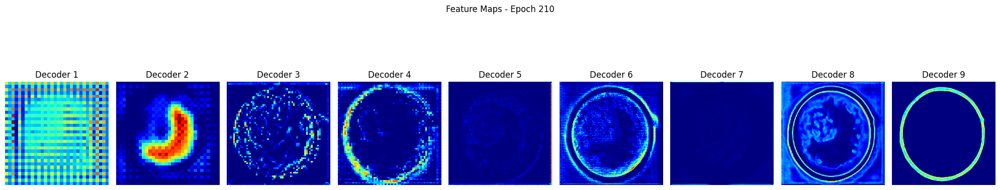

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9941 - dice_coef: 0.9722 - iou: 0.9631 - loss: 0.0278 - precision_1: 0.9801 - recall_1: 0.9825 - val_accuracy: 0.9739 - val_dice_coef: 0.9175 - val_iou: 0.8608 - val_loss: 0.0852 - val_precision_1: 0.9091 - val_recall_1: 0.9345 - learning_rate: 1.0000e-04
Epoch 211/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9942 - dice_coef: 0.9716 - iou: 0.9627 - loss: 0.0284 - precision_1: 0.9809 - recall_1: 0.9816 - val_accuracy: 0.9722 - val_dice_coef: 0.9131 - val_iou: 0.8530 - val_loss: 0.0904 - val_precision_1: 0.9101 - val_recall_1: 0.9222 - learning_rate: 1.0000e-04
Epoch 212/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9942 - dice_coef: 0.9730 - iou: 0.9637 - loss: 0.0270 - precision_1: 0.9807 - recall_1: 0.9826 - val_accuracy: 0.9727 - val_dice_coef: 0.9152 - val_iou: 0.8560 - val_loss: 0.0875 - val_precision_1: 0.8984 - val_recall_1: 0.9404 - learning_rate: 1.0000e-04
Epoch 213/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

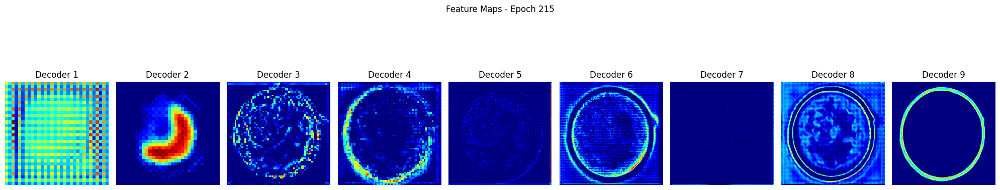

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9939 - dice_coef: 0.9727 - iou: 0.9621 - loss: 0.0273 - precision_1: 0.9790 - recall_1: 0.9827 - val_accuracy: 0.9731 - val_dice_coef: 0.9163 - val_iou: 0.8573 - val_loss: 0.0861 - val_precision_1: 0.9016 - val_recall_1: 0.9391 - learning_rate: 1.0000e-04
Epoch 216/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9940 - dice_coef: 0.9731 - iou: 0.9624 - loss: 0.0269 - precision_1: 0.9808 - recall_1: 0.9813 - val_accuracy: 0.9710 - val_dice_coef: 0.9102 - val_iou: 0.8462 - val_loss: 0.0917 - val_precision_1: 0.8903 - val_recall_1: 0.9394 - learning_rate: 1.0000e-04
Epoch 217/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9940 - dice_coef: 0.9739 - iou: 0.9633 - loss: 0.0261 - precision_1: 0.9789 - recall_1: 0.9839 - val_accuracy: 0.9725 - val_dice_coef: 0.9147 - val_iou: 0.8538 - val_loss: 0.0876 - val_precision_1: 0.8986 - val_recall_1: 0.9386 - learning_rate: 1.0000e-04
Epoch 218/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

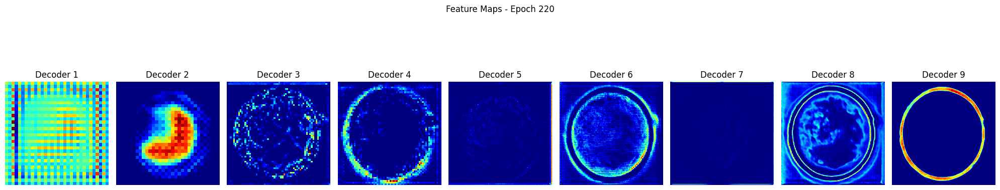

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9901 - dice_coef: 0.9612 - iou: 0.9395 - loss: 0.0388 - precision_1: 0.9656 - recall_1: 0.9724 - val_accuracy: 0.9718 - val_dice_coef: 0.9138 - val_iou: 0.8520 - val_loss: 0.0901 - val_precision_1: 0.9081 - val_recall_1: 0.9221 - learning_rate: 1.0000e-04
Epoch 221/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9918 - dice_coef: 0.9667 - iou: 0.9491 - loss: 0.0333 - precision_1: 0.9712 - recall_1: 0.9770 - val_accuracy: 0.9729 - val_dice_coef: 0.9158 - val_iou: 0.8553 - val_loss: 0.0874 - val_precision_1: 0.9165 - val_recall_1: 0.9188 - learning_rate: 1.0000e-04
Epoch 222/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9923 - dice_coef: 0.9691 - iou: 0.9527 - loss: 0.0309 - precision_1: 0.9726 - recall_1: 0.9796 - val_accuracy: 0.9727 - val_dice_coef: 0.9150 - val_iou: 0.8539 - val_loss: 0.0885 - val_precision_1: 0.9211 - val_recall_1: 0.9121 - learning_rate: 1.0000e-04
Epoch 223/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

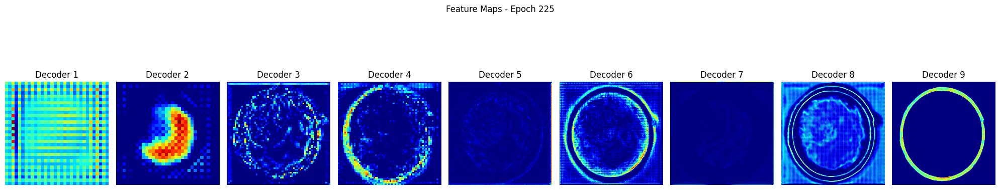

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9925 - dice_coef: 0.9690 - iou: 0.9527 - loss: 0.0310 - precision_1: 0.9739 - recall_1: 0.9779 - val_accuracy: 0.9727 - val_dice_coef: 0.9161 - val_iou: 0.8548 - val_loss: 0.0863 - val_precision_1: 0.9011 - val_recall_1: 0.9367 - learning_rate: 1.0000e-04
Epoch 226/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9932 - dice_coef: 0.9724 - iou: 0.9579 - loss: 0.0276 - precision_1: 0.9778 - recall_1: 0.9796 - val_accuracy: 0.9738 - val_dice_coef: 0.9184 - val_iou: 0.8585 - val_loss: 0.0836 - val_precision_1: 0.9104 - val_recall_1: 0.9322 - learning_rate: 1.0000e-04
Epoch 227/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9937 - dice_coef: 0.9737 - iou: 0.9604 - loss: 0.0263 - precision_1: 0.9792 - recall_1: 0.9807 - val_accuracy: 0.9734 - val_dice_coef: 0.9170 - val_iou: 0.8557 - val_loss: 0.0847 - val_precision_1: 0.9093 - val_recall_1: 0.9309 - learning_rate: 1.0000e-04
Epoch 228/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

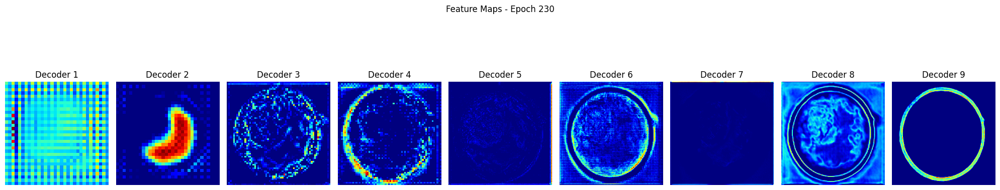

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9946 - dice_coef: 0.9770 - iou: 0.9660 - loss: 0.0230 - precision_1: 0.9824 - recall_1: 0.9833 - val_accuracy: 0.9732 - val_dice_coef: 0.9182 - val_iou: 0.8575 - val_loss: 0.0857 - val_precision_1: 0.9221 - val_recall_1: 0.9145 - learning_rate: 1.0000e-04
Epoch 231/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9943 - dice_coef: 0.9769 - iou: 0.9651 - loss: 0.0231 - precision_1: 0.9823 - recall_1: 0.9827 - val_accuracy: 0.9727 - val_dice_coef: 0.9164 - val_iou: 0.8538 - val_loss: 0.0860 - val_precision_1: 0.9062 - val_recall_1: 0.9303 - learning_rate: 1.0000e-04
Epoch 232/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9945 - dice_coef: 0.9763 - iou: 0.9647 - loss: 0.0237 - precision_1: 0.9815 - recall_1: 0.9829 - val_accuracy: 0.9733 - val_dice_coef: 0.9189 - val_iou: 0.8580 - val_loss: 0.0841 - val_precision_1: 0.9100 - val_recall_1: 0.9298 - learning_rate: 1.0000e-04
Epoch 233/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 0

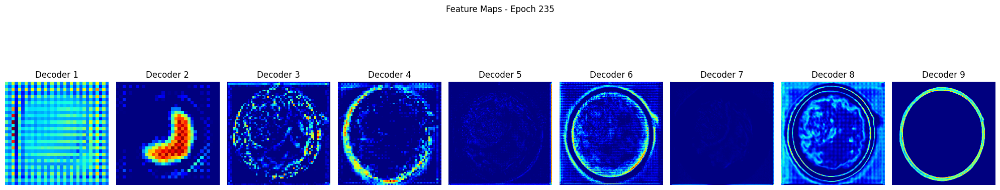

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9957 - dice_coef: 0.9807 - iou: 0.9726 - loss: 0.0193 - precision_1: 0.9857 - recall_1: 0.9868 - val_accuracy: 0.9731 - val_dice_coef: 0.9189 - val_iou: 0.8577 - val_loss: 0.0840 - val_precision_1: 0.9042 - val_recall_1: 0.9356 - learning_rate: 1.0000e-05
Epoch 236/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9958 - dice_coef: 0.9811 - iou: 0.9733 - loss: 0.0189 - precision_1: 0.9864 - recall_1: 0.9868 - val_accuracy: 0.9732 - val_dice_coef: 0.9191 - val_iou: 0.8580 - val_loss: 0.0838 - val_precision_1: 0.9029 - val_recall_1: 0.9376 - learning_rate: 1.0000e-05
Epoch 237/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9960 - dice_coef: 0.9823 - iou: 0.9753 - loss: 0.0177 - precision_1: 0.9867 - recall_1: 0.9886 - val_accuracy: 0.9733 - val_dice_coef: 0.9193 - val_iou: 0.8583 - val_loss: 0.0835 - val_precision_1: 0.9039 - val_recall_1: 0.9372 - learning_rate: 1.0000e-05
Epoch 238/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

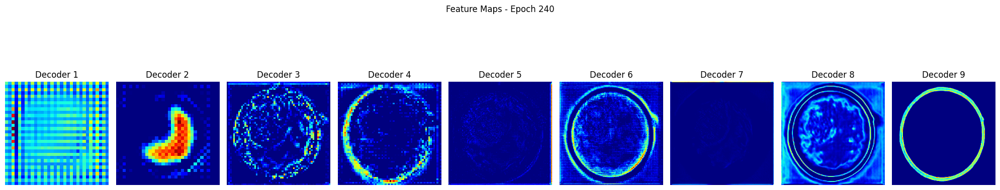

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9962 - dice_coef: 0.9825 - iou: 0.9759 - loss: 0.0175 - precision_1: 0.9877 - recall_1: 0.9881 - val_accuracy: 0.9732 - val_dice_coef: 0.9191 - val_iou: 0.8581 - val_loss: 0.0838 - val_precision_1: 0.9053 - val_recall_1: 0.9349 - learning_rate: 1.0000e-05
Epoch 241/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9964 - dice_coef: 0.9837 - iou: 0.9776 - loss: 0.0163 - precision_1: 0.9884 - recall_1: 0.9891 - val_accuracy: 0.9733 - val_dice_coef: 0.9195 - val_iou: 0.8587 - val_loss: 0.0833 - val_precision_1: 0.9035 - val_recall_1: 0.9377 - learning_rate: 1.0000e-05
Epoch 242/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9964 - dice_coef: 0.9834 - iou: 0.9772 - loss: 0.0166 - precision_1: 0.9881 - recall_1: 0.9891 - val_accuracy: 0.9732 - val_dice_coef: 0.9192 - val_iou: 0.8581 - val_loss: 0.0836 - val_precision_1: 0.9034 - val_recall_1: 0.9371 - learning_rate: 1.0000e-05
Epoch 243/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 0

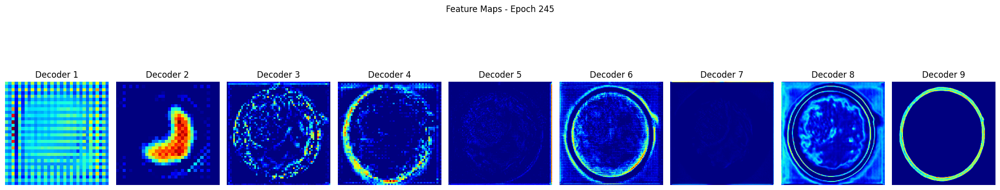

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9964 - dice_coef: 0.9832 - iou: 0.9769 - loss: 0.0168 - precision_1: 0.9879 - recall_1: 0.9890 - val_accuracy: 0.9733 - val_dice_coef: 0.9196 - val_iou: 0.8586 - val_loss: 0.0833 - val_precision_1: 0.9034 - val_recall_1: 0.9377 - learning_rate: 1.0000e-06
Epoch 246/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9964 - dice_coef: 0.9836 - iou: 0.9776 - loss: 0.0164 - precision_1: 0.9881 - recall_1: 0.9894 - val_accuracy: 0.9733 - val_dice_coef: 0.9195 - val_iou: 0.8587 - val_loss: 0.0834 - val_precision_1: 0.9040 - val_recall_1: 0.9369 - learning_rate: 1.0000e-06
Epoch 247/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9966 - dice_coef: 0.9839 - iou: 0.9784 - loss: 0.0161 - precision_1: 0.9885 - recall_1: 0.9897 - val_accuracy: 0.9733 - val_dice_coef: 0.9195 - val_iou: 0.8585 - val_loss: 0.0834 - val_precision_1: 0.9037 - val_recall_1: 0.9372 - learning_rate: 1.0000e-06
Epoch 248/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

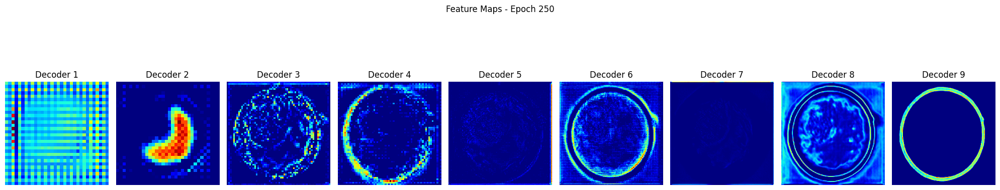

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9965 - dice_coef: 0.9837 - iou: 0.9782 - loss: 0.0163 - precision_1: 0.9884 - recall_1: 0.9897 - val_accuracy: 0.9733 - val_dice_coef: 0.9196 - val_iou: 0.8586 - val_loss: 0.0833 - val_precision_1: 0.9041 - val_recall_1: 0.9369 - learning_rate: 1.0000e-06
Epoch 251/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9965 - dice_coef: 0.9831 - iou: 0.9773 - loss: 0.0169 - precision_1: 0.9883 - recall_1: 0.9889 - val_accuracy: 0.9732 - val_dice_coef: 0.9195 - val_iou: 0.8585 - val_loss: 0.0834 - val_precision_1: 0.9034 - val_recall_1: 0.9374 - learning_rate: 1.0000e-06
Epoch 252/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9965 - dice_coef: 0.9840 - iou: 0.9783 - loss: 0.0160 - precision_1: 0.9887 - recall_1: 0.9895 - val_accuracy: 0.9733 - val_dice_coef: 0.9197 - val_iou: 0.8588 - val_loss: 0.0832 - val_precision_1: 0.9041 - val_recall_1: 0.9370 - learning_rate: 1.0000e-06
Epoch 253/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 0

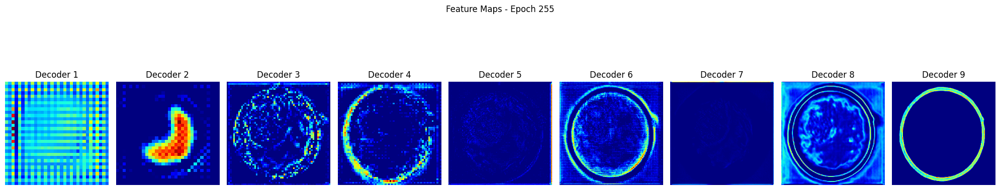

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9966 - dice_coef: 0.9839 - iou: 0.9783 - loss: 0.0161 - precision_1: 0.9887 - recall_1: 0.9894 - val_accuracy: 0.9733 - val_dice_coef: 0.9196 - val_iou: 0.8587 - val_loss: 0.0833 - val_precision_1: 0.9038 - val_recall_1: 0.9372 - learning_rate: 1.0000e-07
Epoch 256/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9966 - dice_coef: 0.9838 - iou: 0.9783 - loss: 0.0162 - precision_1: 0.9890 - recall_1: 0.9891 - val_accuracy: 0.9733 - val_dice_coef: 0.9195 - val_iou: 0.8586 - val_loss: 0.0834 - val_precision_1: 0.9037 - val_recall_1: 0.9374 - learning_rate: 1.0000e-07
Epoch 257/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9965 - dice_coef: 0.9839 - iou: 0.9780 - loss: 0.0161 - precision_1: 0.9886 - recall_1: 0.9894 - val_accuracy: 0.9733 - val_dice_coef: 0.9196 - val_iou: 0.8587 - val_loss: 0.0833 - val_precision_1: 0.9038 - val_recall_1: 0.9373 - learning_rate: 1.0000e-07
Epoch 258/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

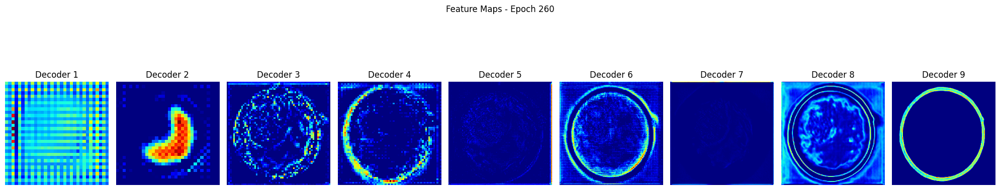

63/63 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9965 - dice_coef: 0.9838 - iou: 0.9780 - loss: 0.0162 - precision_1: 0.9886 - recall_1: 0.9894 - val_accuracy: 0.9733 - val_dice_coef: 0.9195 - val_iou: 0.8587 - val_loss: 0.0834 - val_precision_1: 0.9038 - val_recall_1: 0.9372 - learning_rate: 1.0000e-07
Epoch 261/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9965 - dice_coef: 0.9838 - iou: 0.9782 - loss: 0.0162 - precision_1: 0.9886 - recall_1: 0.9895 - val_accuracy: 0.9733 - val_dice_coef: 0.9196 - val_iou: 0.8587 - val_loss: 0.0833 - val_precision_1: 0.9039 - val_recall_1: 0.9371 - learning_rate: 1.0000e-07
Epoch 262/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.9966 - dice_coef: 0.9839 - iou: 0.9783 - loss: 0.0161 - precision_1: 0.9889 - recall_1: 0.9894 - val_accuracy: 0.9733 - val_dice_coef: 0.9195 - val_iou: 0.8587 - val_loss: 0.0833 - val_precision_1: 0.9037 - val_recall_1: 0.9373 - learning_rate: 1.0000e-07
Epoch 263/300
63/63 ━━━━━━━━━━━━━━━━━━━━ 1

In [24]:
modelzp_totale.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=300,
    callbacks=[callbacks,feature_map_callback],
)

In [25]:
modelzp_totale.evaluate(test_dataset)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 481ms/step - accuracy: 0.9725 - dice_coef: 0.9144 - iou: 0.8498 - loss: 0.0866 - precision_1: 0.9081 - recall_1: 0.9269


[0.08528250455856323,
 0.916230320930481,
 0.8531994223594666,
 0.973496675491333,
 0.928046464920044,
 0.9093937873840332]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


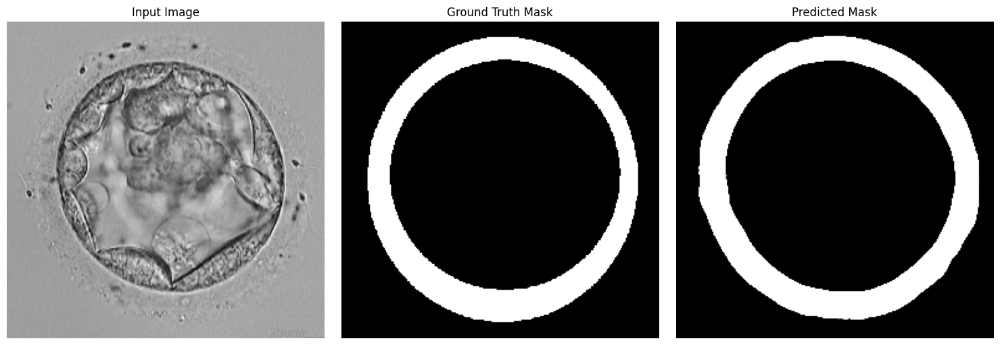

In [29]:

pred_dict = modelzp_totale.predict(sample_img_exp)
output = pred_dict[0]  # (H, W, 1)

# Plotting
plt.figure(figsize=(15, 5))

# Input image
plt.subplot(1, 3, 1)
plt.imshow(sample_img)
plt.title("Input Image")
plt.axis('off')

# Ground truth mask
plt.subplot(1, 3, 2)
plt.imshow(sample_mask[..., 0] if sample_mask.ndim == 3 else sample_mask, cmap='gray')
plt.title("Ground Truth Mask")
plt.axis('off')

# Predicted mask
plt.subplot(1, 3, 3)
plt.imshow(output[..., 0], cmap='gray')
plt.title("Predicted Mask")
plt.axis('off')

plt.tight_layout()
plt.show()


In [30]:
modelzp_totale.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 256, 256, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ activation_3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 115,148,297 (439.26 MB)

 Trainable params: 38,376,661 (146.40 MB)

 Non-trainable params: 18,312 (71.53 KB)

 Optimizer params: 76,753,324 (292.79 MB)

In [31]:
modelzp_totale.save('canet_zp.keras') 